# Budgeted Evidence Retrieval: Centroid vs Coreset Analysis

This notebook provides research-grade analysis comparing **Centroid** and **Coreset (Greedy Facility Location)** importance scoring methods across different budget constraints.

## Contents
1. [Setup & Data Loading](#1-setup--data-loading)
2. [Data Preprocessing](#2-data-preprocessing)
3. [Centroid vs Coreset Comparison](#3-centroid-vs-coreset-comparison)
4. [Tables for Research Paper](#4-tables-for-research-paper)
5. [Visualizations](#5-visualizations)
6. [Statistical Analysis](#6-statistical-analysis)
7. [Summary & Best Configurations](#7-summary--best-configurations)
8. [Corpus Filtering Experiment](#8-corpus-filtering-experiment)

## 1. Setup & Data Loading

In [1]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import defaultdict
import warnings

warnings.filterwarnings('ignore')

# Create high-resolution figures directory
FIGURES_DIR = Path('figures_hires')
FIGURES_DIR.mkdir(exist_ok=True)

# =============================================================================
# PROFESSIONAL RESEARCH THEME - Publication-Quality Settings
# =============================================================================

# Use seaborn style with fallback for compatibility
try:
    plt.style.use('seaborn-v0_8-whitegrid')
except:
    plt.style.use('seaborn-whitegrid')

# Override with publication-quality settings
plt.rcParams.update({
    # Font settings - serif for academic publications
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif', 'Palatino', 'Georgia', 'serif'],
    'font.size': 11,
    'axes.labelsize': 13,
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'legend.title_fontsize': 11,
    
    # Figure settings
    'figure.figsize': (10, 6),
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'savefig.format': 'pdf',
    'savefig.pad_inches': 0.1,
    
    # Axes settings - clean academic look
    'axes.facecolor': 'white',
    'axes.edgecolor': '#333333',
    'axes.linewidth': 1.2,
    'axes.grid': True,
    'axes.axisbelow': True,
    'axes.spines.top': False,
    'axes.spines.right': False,
    
    # Grid settings - subtle
    'grid.color': '#E5E5E5',
    'grid.linestyle': '-',
    'grid.linewidth': 0.6,
    'grid.alpha': 0.7,
    
    # Legend settings
    'legend.frameon': True,
    'legend.framealpha': 0.95,
    'legend.facecolor': 'white',
    'legend.edgecolor': '#CCCCCC',
    
    # Line and marker settings
    'lines.linewidth': 2.0,
    'lines.markersize': 8,
    'patch.linewidth': 1.0,
    'patch.edgecolor': '#333333',
})

# =============================================================================
# PROFESSIONAL COLOR PALETTES
# =============================================================================

SOLVER_COLORS = {
    'greedy': '#2E7D32',      # Forest green
    'cost_norm': '#1565C0',   # Deep blue
    'dpp': '#6A1B9A',         # Deep purple
    'topk': '#C62828'         # Deep red
}

OBJECTIVE_COLORS = {
    'mmr': '#00695C',         # Teal
    'graphcut': '#E65100',    # Deep orange
    'fl': '#AD1457',          # Deep pink
    'dpp': '#4527A0'          # Deep purple
}

MODEL_COLORS = {
    'MiniLM-L6': '#D32F2F',
    'MPNet': '#1976D2',
    'BGE-M3': '#388E3C',
    'Stella-1.5B': '#7B1FA2',
    'Qwen-0.6B': '#F57C00',
    'Gemma-300M': '#00796B'
}

MODEL_MARKERS = {
    'MiniLM-L6': 'o',
    'MPNet': 's',
    'BGE-M3': '^',
    'Stella-1.5B': 'D',
    'Qwen-0.6B': 'v',
    'Gemma-300M': 'p'
}

PRIOR_COLORS = {
    'centroid': '#C62828',   # Deep red
    'coreset': '#1565C0'     # Deep blue
}

# =============================================================================
# UTILITY FUNCTIONS
# =============================================================================

def save_figure(fig, filename, dpi=300, formats=['pdf', 'png']):
    """Save figure in multiple formats with consistent settings."""
    for fmt in formats:
        fig.savefig(FIGURES_DIR / f"{filename}.{fmt}", dpi=dpi, bbox_inches='tight')
    plt.close(fig)
    
def get_color_palette(category):
    """Get appropriate color palette for category."""
    palettes = {
        'solver': SOLVER_COLORS,
        'objective': OBJECTIVE_COLORS,
        'model': MODEL_COLORS,
        'prior': PRIOR_COLORS
    }
    return palettes.get(category, {})

print(f"✓ Professional research theme applied")
print(f"✓ Figures directory: {FIGURES_DIR.absolute()}")

✓ Professional research theme applied
✓ Figures directory: /Users/vedumrajkar/Desktop/budgeted-ret/figures_hires


In [2]:
def load_all_results(base_path: str = ".") -> pd.DataFrame:
    """
    Load all results from both Centroid and Coreset output directories.
    
    Returns:
        DataFrame with columns: budget, model, prior_method, strategy, objective, solver, config, + all metrics
    """
    base = Path(base_path)
    budgets = [250, 500, 750, 1000, 1250, 1500]
    all_records = []
    
    # Define directory patterns for both prior methods
    dir_patterns = [
        ('centroid', 'output{budget}'),
        ('coreset', 'output_coreset{budget}')
    ]
    
    for budget in budgets:
        for prior_method, dir_pattern in dir_patterns:
            output_dir = base / dir_pattern.format(budget=budget)
            
            if not output_dir.exists():
                continue
                
            for json_file in output_dir.glob("metrics_*.json"):
                try:
                    with open(json_file, 'r') as f:
                        data = json.load(f)
                    
                    model_name = data.get('model_name', 'unknown')
                    
                    for config_name, metrics in data.get('aggregate_metrics', {}).items():
                        parts = config_name.split('/')
                        record = {
                            'budget': budget,
                            'model': model_name,
                            'prior_method': prior_method,
                            'strategy': parts[0] if len(parts) > 0 else '',
                            'objective': parts[1] if len(parts) > 1 else '',
                            'solver': parts[2] if len(parts) > 2 else '',
                            'config': config_name,
                            **metrics
                        }
                        all_records.append(record)
                        
                except (json.JSONDecodeError, KeyError) as e:
                    print(f"Warning: Failed to load {json_file}: {e}")
                    continue
    
    if not all_records:
        raise ValueError("No valid results found. Check base_path and directory structure.")
    
    df = pd.DataFrame(all_records)
    
    # Summary statistics
    print(f"✓ Loaded {len(df):,} records across {df['model'].nunique()} models")
    print(f"  Prior methods: {df['prior_method'].unique().tolist()}")
    print(f"  Budgets: {sorted(df['budget'].unique().tolist())}")
    print(f"  Configurations: {df['config'].nunique()}")
    
    return df

# Load the data
df = load_all_results(base_path="output")
df.head()

✓ Loaded 720 records across 6 models
  Prior methods: ['centroid', 'coreset']
  Budgets: [250, 500, 750, 1000, 1250, 1500]
  Configurations: 10


,budget,model,prior_method,strategy,objective,solver,config,avg_decision_coverage,avg_density_phi,decision_D1_coverage,decision_D2_coverage,decision_D3_coverage,decision_D4_coverage,decision_D5_coverage,global_gr_coverage,redundancy_score,semantic_volume
0,250,BAAI/bge-m3,centroid,prior,mmr,greedy,prior/mmr/greedy,0.654181,0.031538,0.647608,0.660159,0.639049,0.629596,0.644452,0.629525,0.238111,-0.100795
1,250,BAAI/bge-m3,centroid,prior,graphcut,greedy,prior/graphcut/greedy,0.654276,0.031523,0.648258,0.660055,0.639019,0.629586,0.626361,0.629558,0.237834,-0.100337
2,250,BAAI/bge-m3,centroid,prior,fl,greedy,prior/fl/greedy,0.799150,0.017614,0.804056,0.795714,0.787266,0.767340,0.804616,0.784150,0.362935,-0.288208
3,250,BAAI/bge-m3,centroid,prior,mmr,cost_norm,prior/mmr/cost_norm,0.691785,0.026514,0.690694,0.688945,0.686325,0.670040,0.664431,0.673429,0.329098,-0.119842
4,250,BAAI/bge-m3,centroid,prior,graphcut,cost_norm,prior/graphcut/cost_norm,0.691785,0.026514,0.690694,0.688945,0.686325,0.670040,0.664431,0.673429,0.329098,-0.119842


In [3]:
# Save combined results
df.to_csv("all_results_combined.csv", index=False)
print(f"Saved combined results to all_results_combined.csv")

Saved combined results to all_results_combined.csv


In [4]:
df[df['objective'] =='dpp']

,budget,model,prior_method,strategy,objective,solver,config,avg_decision_coverage,avg_density_phi,decision_D1_coverage,decision_D2_coverage,decision_D3_coverage,decision_D4_coverage,decision_D5_coverage,global_gr_coverage,redundancy_score,semantic_volume
6,250,BAAI/bge-m3,centroid,prior,dpp,dpp,prior/dpp/dpp,0.631532,0.035011,0.625500,0.634346,0.628881,0.626734,0.633883,0.600692,0.327792,-0.234240
16,250,NovaSearch/stella_en_1.5B_v5,centroid,prior,dpp,dpp,prior/dpp/dpp,0.380677,0.087592,0.377463,0.386610,0.373545,0.376800,0.469920,0.341222,0.184602,-0.085765
26,250,all-MiniLM-L6-v2,centroid,prior,dpp,dpp,prior/dpp/dpp,0.221940,0.105275,0.220137,0.227707,0.215890,0.219101,0.231346,0.211091,0.108199,-0.050805
36,250,google/embeddinggemma-300m,centroid,prior,dpp,dpp,prior/dpp/dpp,0.482814,0.058451,0.481818,0.482278,0.475865,0.480900,0.564020,0.450461,0.200231,-0.087476
46,250,Qwen/Qwen3-Embedding-0.6B,centroid,prior,dpp,dpp,prior/dpp/dpp,0.733575,0.024473,0.733422,0.731937,0.738349,0.722730,0.689857,0.716450,0.404482,-0.378396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
676,1500,NovaSearch/stella_en_1.5B_v5,coreset,prior,dpp,dpp,prior/dpp/dpp,0.685377,0.091605,0.693934,0.681916,0.665193,0.674577,0.614104,0.648795,0.273370,-2.315592
686,1500,all-MiniLM-L6-v2,coreset,prior,dpp,dpp,prior/dpp/dpp,0.641336,0.116037,0.640988,0.642152,0.640726,0.606099,0.438209,0.614281,0.156556,-1.254955
696,1500,google/embeddinggemma-300m,coreset,prior,dpp,dpp,prior/dpp/dpp,0.757187,0.089319,0.761941,0.756462,0.742291,0.738073,0.699149,0.723944,0.279345,-1.811889
706,1500,Qwen/Qwen3-Embedding-0.6B,coreset,prior,dpp,dpp,prior/dpp/dpp,0.838967,0.031855,0.837807,0.837620,0.835738,0.842821,0.830875,0.825072,0.590045,-5.981405


In [5]:
# embedding_models = df['model'].unique().tolist()
# print("Embedding models found:", embedding_models)

# ## removing dpp objective as it is not performing well
# df = df[df['objective'] != 'dpp']
# print(f"Filtered out 'dpp' objective, resulting in {len(df)} records.")

In [6]:
# Optional: Filter to specific model (comment out to use all models)
# df = df[df['model'] == 'all-mpnet-base-v2']
# print(f"Filtered data to 'all-mpnet-base-v2', resulting in {len(df)} records.")

print(f"Using all {len(df['model'].unique())} models with {len(df)} records.")

Using all 6 models with 720 records.


In [7]:
def load_per_paper_results(base_path: str = ".") -> pd.DataFrame:
    """
    Load per-paper results for variance analysis from both Centroid and Coreset directories.
    """
    base = Path(base_path)
    budgets = [250, 500, 750, 1000, 1250, 1500]
    
    all_records = []
    
    for budget in budgets:
        for prior_method, dir_pattern in [('centroid', f'output{budget}'), ('coreset', f'output_coreset{budget}')]:
            output_dir = base / dir_pattern
            if not output_dir.exists():
                continue
                
            for json_file in output_dir.glob("metrics_*.json"):
                with open(json_file, 'r') as f:
                    data = json.load(f)
                
                model_name = data['model_name']
                
                for record in data['all_records']:
                    parts = record['config'].split('/')
                    all_records.append({
                        'budget': budget,
                        'model': model_name,
                        'prior_method': prior_method,
                        'paper_id': record['paper_id'],
                        'strategy': parts[0] if len(parts) > 0 else '',
                        'objective': parts[1] if len(parts) > 1 else '',
                        'solver': parts[2] if len(parts) > 2 else '',
                        'config': record['config'],
                        **record['metrics']
                    })
    
    df_papers = pd.DataFrame(all_records)
    print(f"Loaded {len(df_papers)} per-paper records")
    return df_papers

# Load per-paper data
df_papers = load_per_paper_results()
print(f"Per-paper data shape: {df_papers.shape}")

Loaded 0 per-paper records
Per-paper data shape: (0, 0)


In [8]:
# Preprocessing: Define display names and add short columns
METRIC_NAMES = {
    'global_gr_coverage': 'Global GR Coverage',
    'avg_decision_coverage': 'Avg. Decision Coverage',
    'redundancy_score': 'Redundancy',
    'avg_density_phi': 'Info. Density (φ)',
    'semantic_volume': 'Semantic Volume'
}

MODEL_SHORT_NAMES = {
    'all-MiniLM-L6-v2': 'MiniLM-L6',
    'all-mpnet-base-v2': 'MPNet',
    'BAAI/bge-m3': 'BGE-M3',
    'NovaSearch/stella_en_1.5B_v5': 'Stella-1.5B',
    'Qwen/Qwen3-Embedding-0.6B': 'Qwen-0.6B',
    'google/embeddinggemma-300m': 'Gemma-300M'
}

PRIOR_NAMES = {
    'centroid': 'Centroid',
    'coreset': 'Coreset (FL)'
}

# Add short names to dataframe
df['model_short'] = df['model'].map(lambda x: MODEL_SHORT_NAMES.get(x, x))
df['prior_display'] = df['prior_method'].map(lambda x: PRIOR_NAMES.get(x, x))

print("Preprocessing complete. Added model_short and prior_display columns.")

Preprocessing complete. Added model_short and prior_display columns.


In [9]:
print("="*80)
print("DATA SUMMARY")
print("="*80)
print(f"\nBudgets: {sorted(df['budget'].unique())}")
print(f"Prior Methods: {df['prior_method'].unique().tolist()}")
print(f"Models: {df['model_short'].unique().tolist()}")
print(f"Objectives: {df['objective'].unique().tolist()}")
print(f"Solvers: {df['solver'].unique().tolist()}")
print(f"\nRecords per prior method:")
print(df.groupby('prior_method').size())
print(f"\nTotal aggregate records: {len(df)}")
print(f"\nAll figures will be saved as high-resolution PDFs in: {FIGURES_DIR}")

DATA SUMMARY

Budgets: [250, 500, 750, 1000, 1250, 1500]
Prior Methods: ['centroid', 'coreset']
Models: ['BGE-M3', 'Stella-1.5B', 'MiniLM-L6', 'Gemma-300M', 'Qwen-0.6B', 'MPNet']
Objectives: ['mmr', 'graphcut', 'fl', 'dpp']
Solvers: ['greedy', 'cost_norm', 'dpp', 'topk']

Records per prior method:
prior_method
centroid    360
coreset     360
dtype: int64

Total aggregate records: 720

All figures will be saved as high-resolution PDFs in: figures_hires


## 3. Embedding Model Comparison

Comprehensive comparison of all 6 embedding models across configurations.

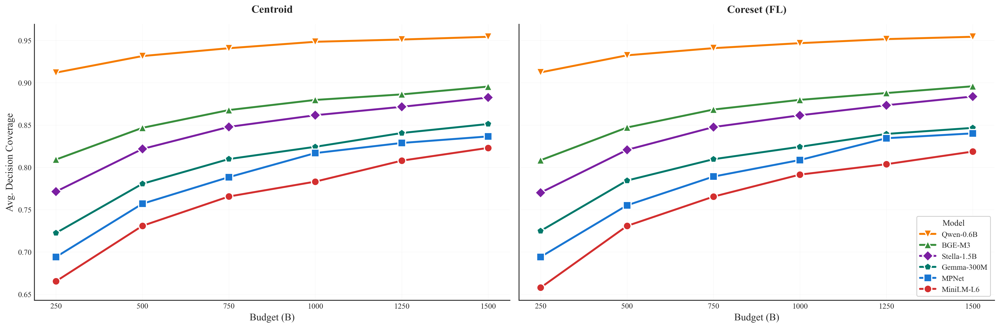


Best Model per Budget (Avg. Decision Coverage):

 Budget Centroid Best Centroid Score Coreset Best Coreset Score
    250     Qwen-0.6B         0.9120    Qwen-0.6B        0.9123
    500     Qwen-0.6B         0.9316    Qwen-0.6B        0.9324
    750     Qwen-0.6B         0.9408    Qwen-0.6B        0.9409
   1000     Qwen-0.6B         0.9484    Qwen-0.6B        0.9468
   1250     Qwen-0.6B         0.9511    Qwen-0.6B        0.9516
   1500     Qwen-0.6B         0.9543    Qwen-0.6B        0.9544


In [10]:
# ============================================================================
# PLOT 1: Model Performance Across Budgets (Line Plot)
# ============================================================================
def plot_model_performance_by_budget(df, metric, prior_method=None, figsize=(12, 7)):
    """Line plot showing each model's performance across budgets."""
    data = df if prior_method is None else df[df['prior_method'] == prior_method]
    
    # Get best config per model/budget
    grouped = data.groupby(['budget', 'model_short'])[metric].max().reset_index()
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Sort models by their max performance (for legend ordering)
    model_max = grouped.groupby('model_short')[metric].max().sort_values(ascending=False)
    
    for model in model_max.index:
        model_data = grouped[grouped['model_short'] == model]
        color = MODEL_COLORS.get(model, '#333333')
        marker = MODEL_MARKERS.get(model, 'o')
        
        ax.plot(model_data['budget'], model_data[metric], '-', 
                marker=marker, label=model, color=color, 
                linewidth=2.5, markersize=10, markeredgecolor='white', markeredgewidth=1.5)
    
    ax.set_xlabel('Budget (B)', fontweight='medium')
    ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
    title = f'Model Comparison: {METRIC_NAMES.get(metric, metric)}'
    if prior_method:
        title += f' ({PRIOR_NAMES[prior_method]})'
    ax.set_title(title, pad=15)
    ax.legend(title='Model', loc='lower right', ncol=2, framealpha=0.95)
    ax.set_xticks(sorted(df['budget'].unique()))
    
    plt.tight_layout()
    return fig, ax

# Side-by-side comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Centroid
data_cent = df[df['prior_method'] == 'centroid']
grouped_cent = data_cent.groupby(['budget', 'model_short'])['avg_decision_coverage'].max().reset_index()
model_max = grouped_cent.groupby('model_short')['avg_decision_coverage'].max().sort_values(ascending=False)
for model in model_max.index:
    model_data = grouped_cent[grouped_cent['model_short'] == model]
    ax1.plot(model_data['budget'], model_data['avg_decision_coverage'], '-', 
            marker=MODEL_MARKERS.get(model, 'o'), label=model, color=MODEL_COLORS.get(model, '#333333'),
            linewidth=2.5, markersize=10, markeredgecolor='white', markeredgewidth=1.5)
ax1.set_xlabel('Budget (B)', fontweight='medium')
ax1.set_ylabel('Avg. Decision Coverage', fontweight='medium')
ax1.set_title('Centroid', pad=15, fontweight='bold')
ax1.set_xticks(sorted(df['budget'].unique()))
ax1.grid(True, alpha=0.3)

# Coreset
data_core = df[df['prior_method'] == 'coreset']
grouped_core = data_core.groupby(['budget', 'model_short'])['avg_decision_coverage'].max().reset_index()
model_max = grouped_core.groupby('model_short')['avg_decision_coverage'].max().sort_values(ascending=False)
for model in model_max.index:
    model_data = grouped_core[grouped_core['model_short'] == model]
    ax2.plot(model_data['budget'], model_data['avg_decision_coverage'], '-',
            marker=MODEL_MARKERS.get(model, 'o'), label=model, color=MODEL_COLORS.get(model, '#333333'),
            linewidth=2.5, markersize=10, markeredgecolor='white', markeredgewidth=1.5)
ax2.set_xlabel('Budget (B)', fontweight='medium')
ax2.set_title('Coreset (FL)', pad=15, fontweight='bold')
ax2.set_xticks(sorted(df['budget'].unique()))
ax2.legend(title='Model', loc='lower right', ncol=1, framealpha=0.95)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(FIGURES_DIR / 'model_comparison_sidebyside.pdf')
plt.show()

# Generate table
print("\nBest Model per Budget (Avg. Decision Coverage):\n")
table_data = []
budgets = sorted(df['budget'].unique())
for budget in budgets:
    # Centroid best
    cent_best = df[(df['prior_method'] == 'centroid') & (df['budget'] == budget)].nlargest(1, 'avg_decision_coverage')
    # Coreset best  
    core_best = df[(df['prior_method'] == 'coreset') & (df['budget'] == budget)].nlargest(1, 'avg_decision_coverage')
    
    table_data.append({
        'Budget': budget,
        'Centroid Best': cent_best['model_short'].values[0],
        'Centroid Score': f"{cent_best['avg_decision_coverage'].values[0]:.4f}",
        'Coreset Best': core_best['model_short'].values[0],
        'Coreset Score': f"{core_best['avg_decision_coverage'].values[0]:.4f}"
    })

table_df = pd.DataFrame(table_data)
print(table_df.to_string(index=False))

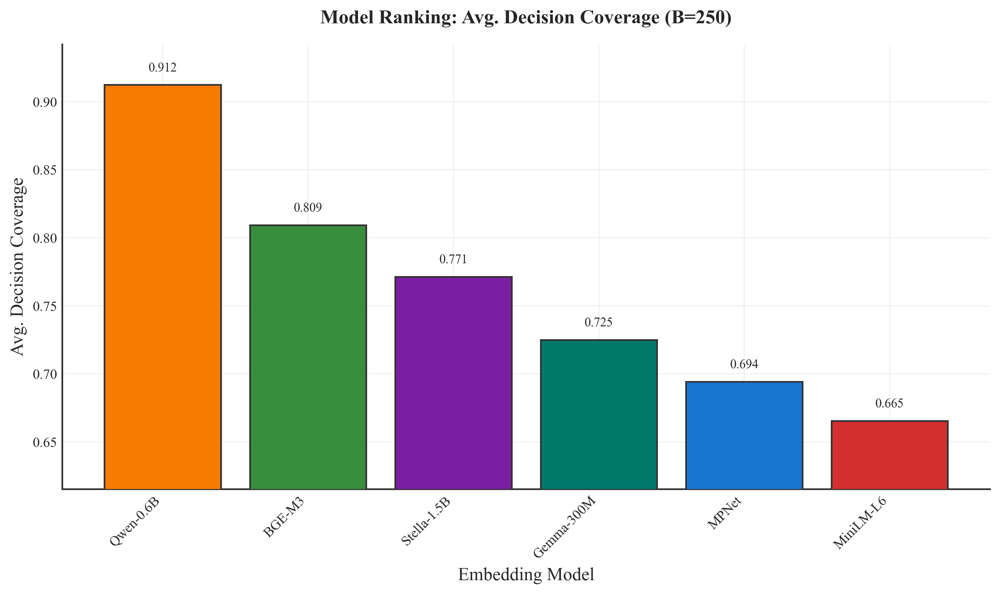

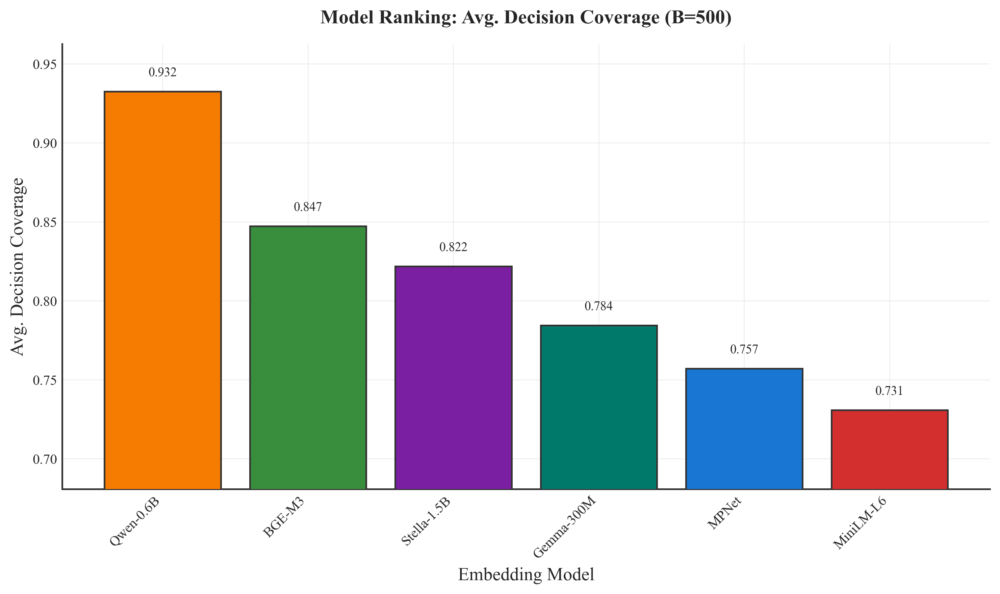

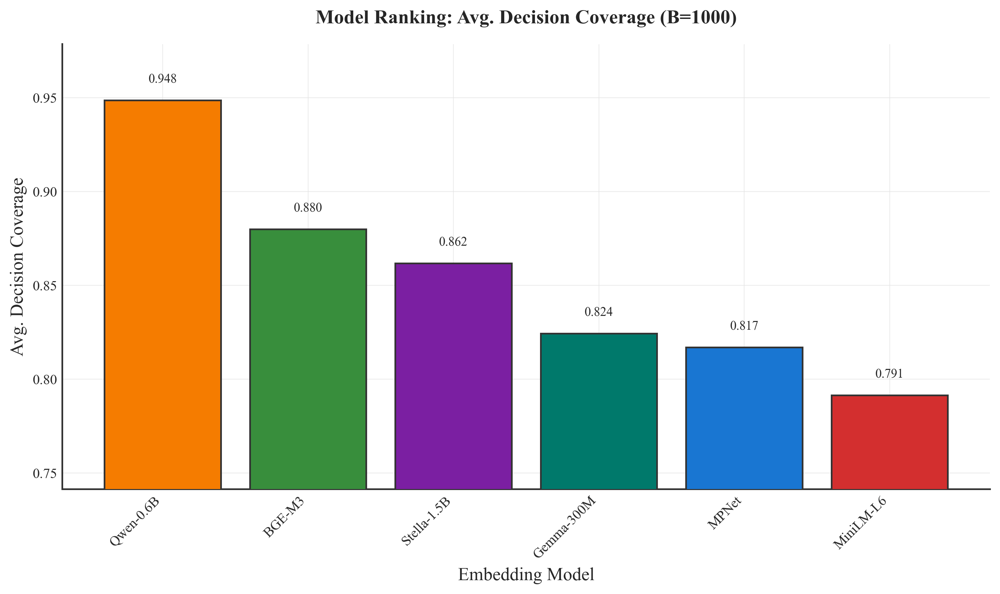

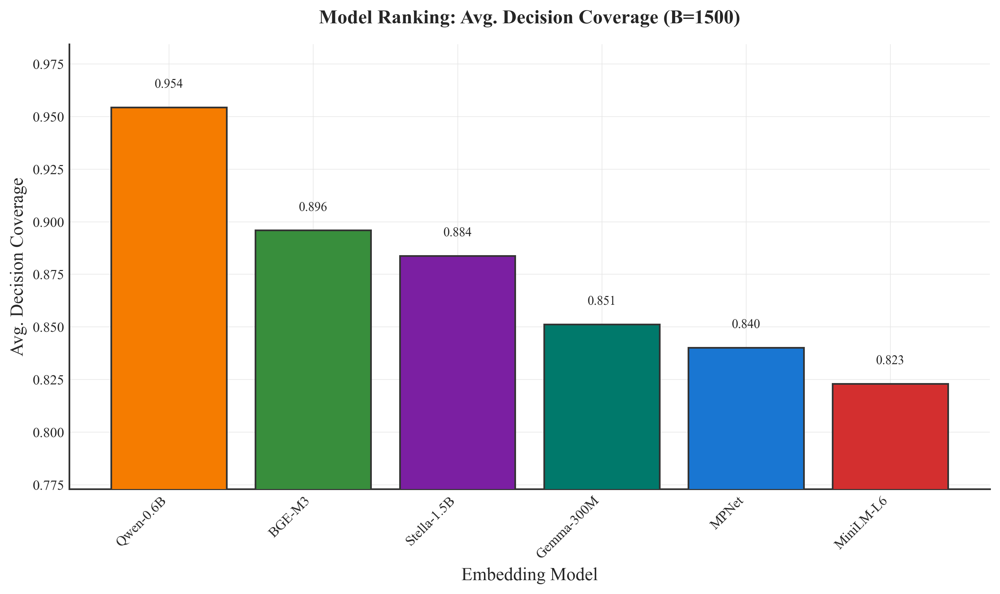

In [11]:
# ============================================================================
# PLOT 2: Model Ranking Bar Chart (at specific budget) - SORTED DESCENDING
# ============================================================================
def plot_model_ranking_bar(df, metric, budget, prior_method=None, figsize=(10, 6)):
    """Bar chart ranking models by performance at a specific budget (descending order)."""
    data = df[df['budget'] == budget]
    if prior_method:
        data = data[data['prior_method'] == prior_method]
    
    # Get best performance per model and sort descending
    model_perf = data.groupby('model_short')[metric].max().sort_values(ascending=False)
    
    fig, ax = plt.subplots(figsize=figsize)
    
    colors = [MODEL_COLORS.get(m, '#333333') for m in model_perf.index]
    bars = ax.bar(range(len(model_perf)), model_perf.values, color=colors, 
                  edgecolor='#333333', linewidth=1.2, zorder=3)
    
    ax.set_xticks(range(len(model_perf)))
    ax.set_xticklabels(model_perf.index, rotation=45, ha='right', fontweight='medium')
    ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
    ax.set_xlabel('Embedding Model', fontweight='medium')
    
    title = f'Model Ranking: {METRIC_NAMES.get(metric, metric)} (B={budget})'
    if prior_method:
        title += f' — {PRIOR_NAMES[prior_method]}'
    ax.set_title(title, pad=15)
    
    # Add value labels on bars with professional styling
    for bar, val in zip(bars, model_perf.values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.008, 
                f'{val:.3f}', ha='center', va='bottom', fontsize=9, fontweight='medium')
    
    # Set y-axis to start from a reasonable point for better visual comparison
    ymin = max(0, model_perf.min() - 0.05)
    ax.set_ylim(ymin, model_perf.max() + 0.03)
    
    plt.tight_layout()
    return fig, ax

# Model ranking at various budgets
for budget in [250, 500, 1000, 1500]:
    fig, ax = plot_model_ranking_bar(df, 'avg_decision_coverage', budget)
    plt.savefig(FIGURES_DIR / f'model_ranking_B{budget}.pdf')
    plt.show()

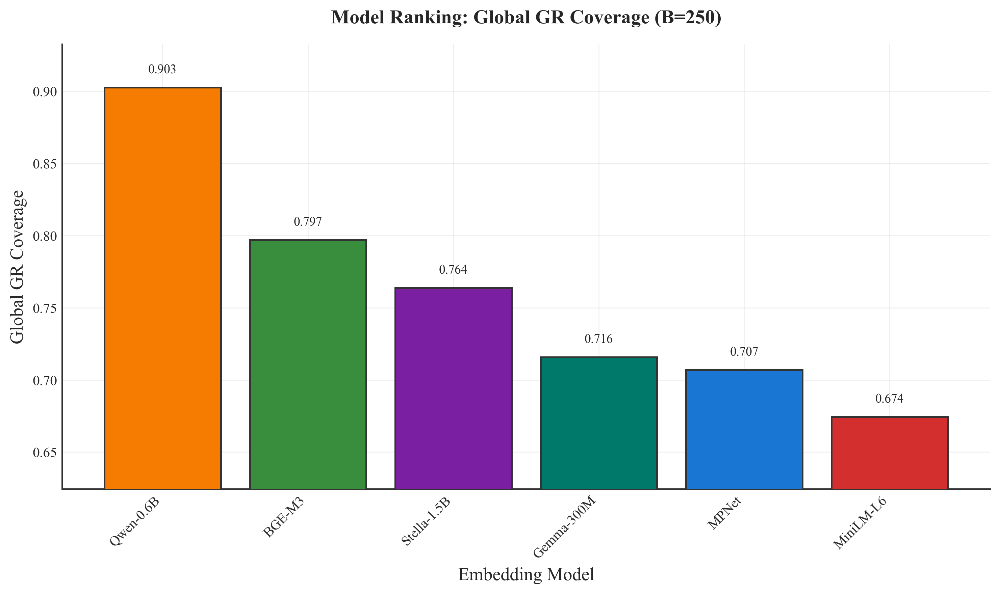

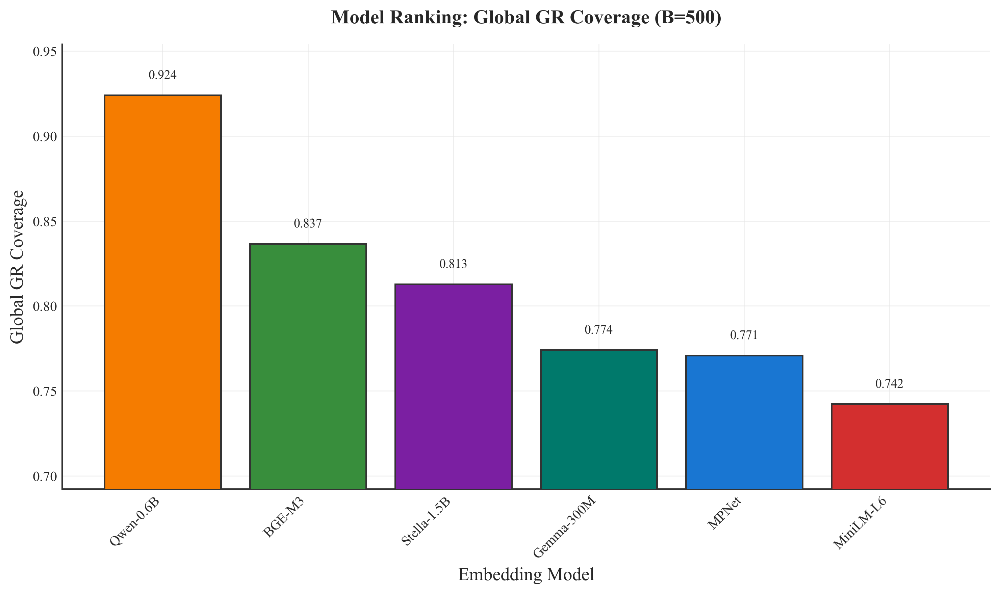

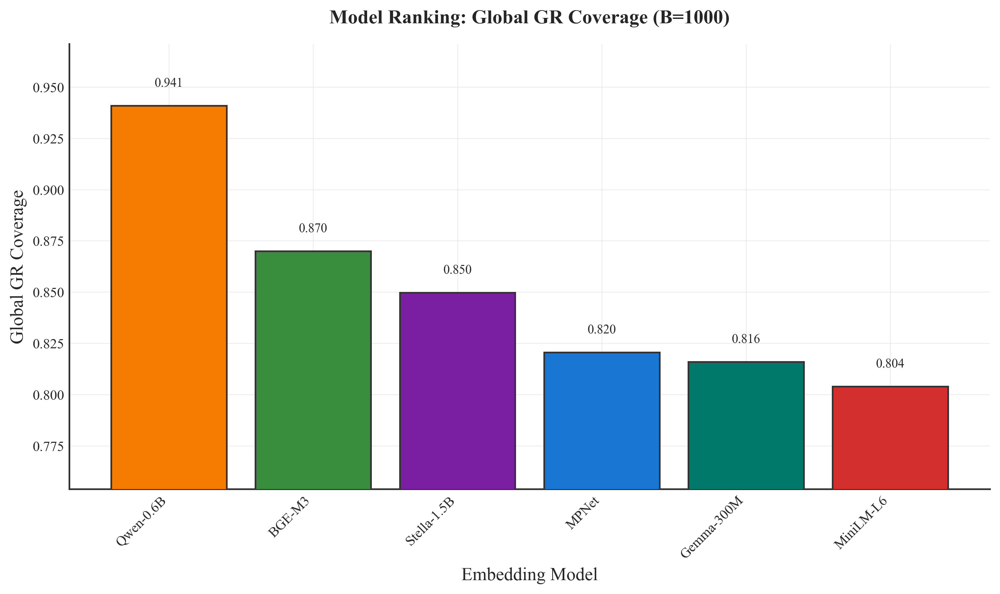

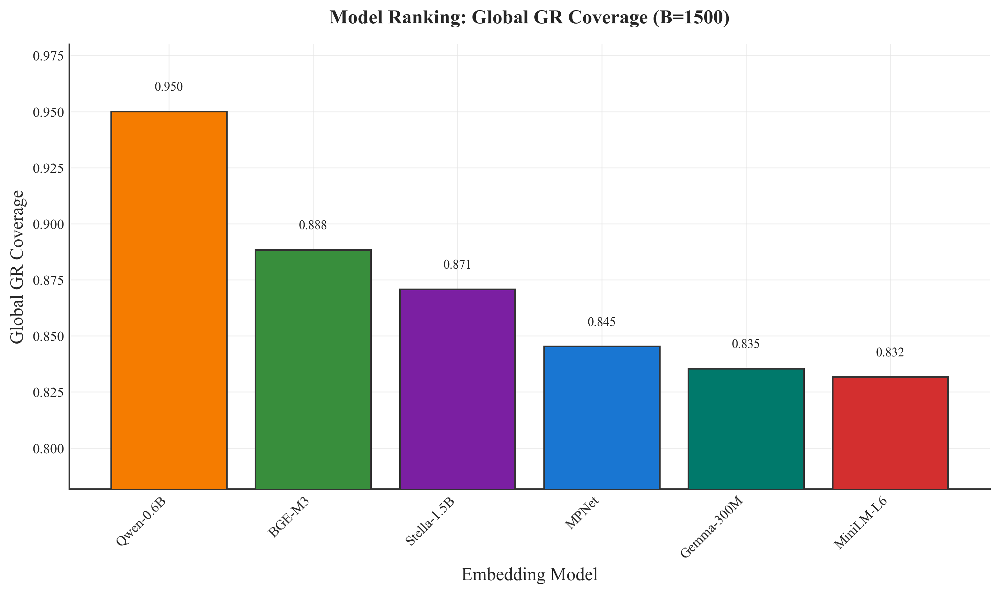

In [12]:
# ============================================================================
# PLOT 2: Model Ranking Bar Chart (at specific budget) - SORTED DESCENDING
# ============================================================================
def plot_model_ranking_bar(df, metric, budget, prior_method=None, figsize=(10, 6)):
    """Bar chart ranking models by performance at a specific budget (descending order)."""
    data = df[df['budget'] == budget]
    if prior_method:
        data = data[data['prior_method'] == prior_method]
    
    # Get best performance per model and sort descending
    model_perf = data.groupby('model_short')[metric].max().sort_values(ascending=False)
    
    fig, ax = plt.subplots(figsize=figsize)
    
    colors = [MODEL_COLORS.get(m, '#333333') for m in model_perf.index]
    bars = ax.bar(range(len(model_perf)), model_perf.values, color=colors, 
                  edgecolor='#333333', linewidth=1.2, zorder=3)
    
    ax.set_xticks(range(len(model_perf)))
    ax.set_xticklabels(model_perf.index, rotation=45, ha='right', fontweight='medium')
    ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
    ax.set_xlabel('Embedding Model', fontweight='medium')
    
    title = f'Model Ranking: {METRIC_NAMES.get(metric, metric)} (B={budget})'
    if prior_method:
        title += f' — {PRIOR_NAMES[prior_method]}'
    ax.set_title(title, pad=15)
    
    # Add value labels on bars with professional styling
    for bar, val in zip(bars, model_perf.values):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.008, 
                f'{val:.3f}', ha='center', va='bottom', fontsize=9, fontweight='medium')
    
    # Set y-axis to start from a reasonable point for better visual comparison
    ymin = max(0, model_perf.min() - 0.05)
    ax.set_ylim(ymin, model_perf.max() + 0.03)
    
    plt.tight_layout()
    return fig, ax

# Model ranking at various budgets
for budget in [250, 500, 1000, 1500]:
    fig, ax = plot_model_ranking_bar(df, 'global_gr_coverage', budget)
    plt.savefig(FIGURES_DIR / f'model_ranking_global_gr_coverage{budget}.pdf')
    plt.show()

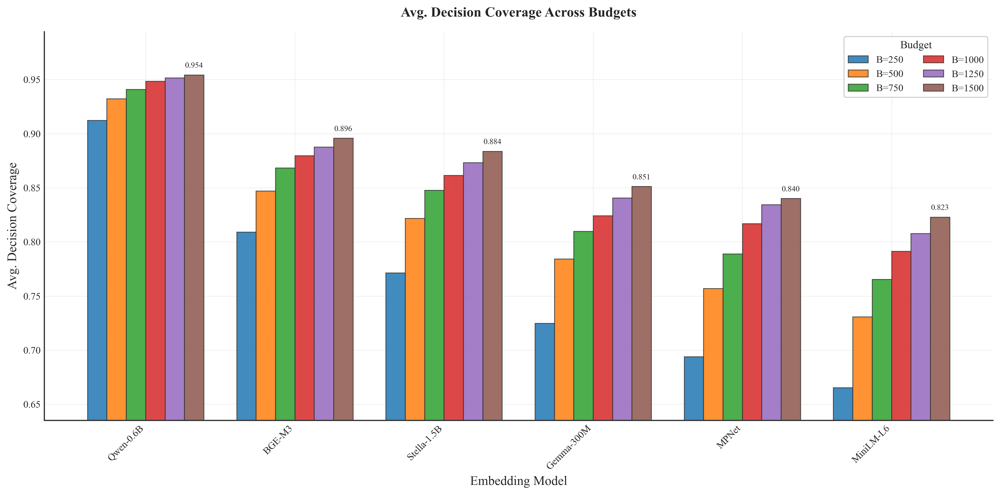

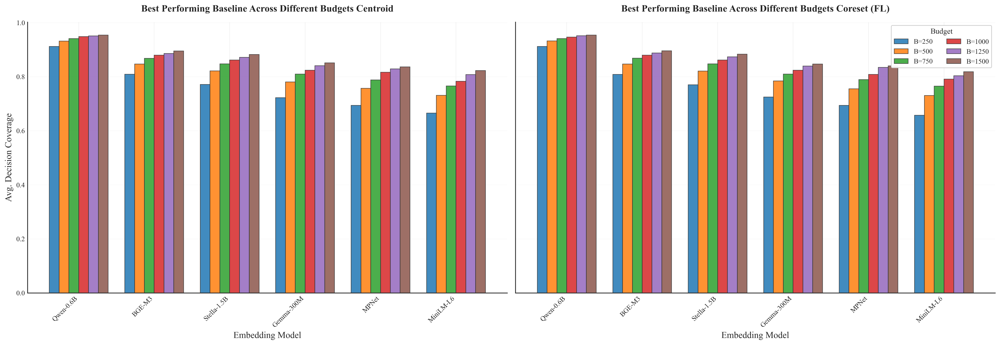

In [ ]:
# ============================================================================
# PLOT 2: Model Performance Across Budgets - Grouped Bar Chart
# ============================================================================
def plot_model_performance_grouped_bars(df, metric, prior_method=None, figsize=(14, 7)):
    """Grouped bar chart showing all models across all budgets."""
    data = df if prior_method is None else df[df['prior_method'] == prior_method]
    
    # Get best config per model/budget
    grouped = data.groupby(['budget', 'model_short'])[metric].max().reset_index()
    pivot = grouped.pivot(index='model_short', columns='budget', values=metric)
    
    # Sort by average performance
    pivot = pivot.loc[pivot.mean(axis=1).sort_values(ascending=False).index]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    budgets = sorted(df['budget'].unique())
    x = np.arange(len(pivot.index))
    width = 0.13  # Width of each bar
    
    # Plot bars for each budget
    for i, budget in enumerate(budgets):
        offset = (i - len(budgets)/2 + 0.5) * width
        bars = ax.bar(x + offset, pivot[budget], width, 
                     label=f'B={budget}',
                     alpha=0.85, edgecolor='#333333', linewidth=0.8)
        
        # Add value labels on top bars only (last budget)
        if i == len(budgets) - 1:
            for j, (bar, val) in enumerate(zip(bars, pivot[budget])):
                ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                       f'{val:.3f}', ha='center', va='bottom', fontsize=8, fontweight='medium')
    
    ax.set_xlabel('Embedding Model', fontweight='medium')
    ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
    title = f'{METRIC_NAMES.get(metric, metric)} Across Budgets'
    if prior_method:
        title += f' ({PRIOR_NAMES[prior_method]})'
    ax.set_title(title, pad=15)
    
    ax.set_xticks(x)
    ax.set_xticklabels(pivot.index, rotation=45, ha='right', fontweight='medium')
    ax.legend(title='Budget', loc='upper right', ncol=2, framealpha=0.95)
    ax.set_ylim(pivot.values.min() - 0.03, pivot.values.max() + 0.04)
    
    plt.tight_layout()
    return fig, ax

# # Single comprehensive plot
# fig, ax = plot_model_performance_grouped_bars(df, 'avg_decision_coverage')
# plt.savefig(FIGURES_DIR / 'model_ranking_all_budgets_grouped.pdf')
# plt.show()

# Side-by-side for prior methods
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7), sharey=True)

for idx, (ax, prior) in enumerate([(ax1, 'centroid'), (ax2, 'coreset')]):
    data = df[df['prior_method'] == prior]
    grouped = data.groupby(['budget', 'model_short'])['avg_decision_coverage'].max().reset_index()
    pivot = grouped.pivot(index='model_short', columns='budget', values='avg_decision_coverage')
    pivot = pivot.loc[pivot.mean(axis=1).sort_values(ascending=False).index]
    
    budgets = sorted(df['budget'].unique())
    x = np.arange(len(pivot.index))
    width = 0.13
    
    for i, budget in enumerate(budgets):
        offset = (i - len(budgets)/2 + 0.5) * width
        bars = ax.bar(x + offset, pivot[budget], width, 
                     label=f'B={budget}',
                     alpha=0.85, edgecolor='#333333', linewidth=0.8)
    
    ax.set_xlabel('Embedding Model', fontweight='medium')
    if idx == 0:
        ax.set_ylabel('Avg. Decision Coverage', fontweight='medium')
    ax.set_title("Best Performing Baseline Across Different Budgets " + PRIOR_NAMES[prior], pad=15, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(pivot.index, rotation=45, ha='right', fontweight='medium')
    if idx == 1:
        ax.legend(title='Budget', loc='upper right', ncol=2, framealpha=0.95)
    ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(FIGURES_DIR / 'best_baseline_model_ranking_budgets_sidebyside.pdf')
plt.show()



In [14]:
df

,budget,model,prior_method,strategy,objective,solver,config,avg_decision_coverage,avg_density_phi,decision_D1_coverage,decision_D2_coverage,decision_D3_coverage,decision_D4_coverage,decision_D5_coverage,global_gr_coverage,redundancy_score,semantic_volume,model_short,prior_display
0,250,BAAI/bge-m3,centroid,prior,mmr,greedy,prior/mmr/greedy,0.654181,0.031538,0.647608,0.660159,0.639049,0.629596,0.644452,0.629525,0.238111,-0.100795,BGE-M3,Centroid
1,250,BAAI/bge-m3,centroid,prior,graphcut,greedy,prior/graphcut/greedy,0.654276,0.031523,0.648258,0.660055,0.639019,0.629586,0.626361,0.629558,0.237834,-0.100337,BGE-M3,Centroid
2,250,BAAI/bge-m3,centroid,prior,fl,greedy,prior/fl/greedy,0.799150,0.017614,0.804056,0.795714,0.787266,0.767340,0.804616,0.784150,0.362935,-0.288208,BGE-M3,Centroid
3,250,BAAI/bge-m3,centroid,prior,mmr,cost_norm,prior/mmr/cost_norm,0.691785,0.026514,0.690694,0.688945,0.686325,0.670040,0.664431,0.673429,0.329098,-0.119842,BGE-M3,Centroid
4,250,BAAI/bge-m3,centroid,prior,graphcut,cost_norm,prior/graphcut/cost_norm,0.691785,0.026514,0.690694,0.688945,0.686325,0.670040,0.664431,0.673429,0.329098,-0.119842,BGE-M3,Centroid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,1500,all-mpnet-base-v2,coreset,prior,fl,cost_norm,prior/fl/cost_norm,0.840153,0.070824,0.846732,0.836480,0.836358,0.809844,0.693146,0.845316,0.247663,-5.913813,MPNet,Coreset (FL)
716,1500,all-mpnet-base-v2,coreset,prior,dpp,dpp,prior/dpp/dpp,0.650252,0.109113,0.655267,0.644911,0.647047,0.635926,0.682760,0.614675,0.172734,-1.590520,MPNet,Coreset (FL)
717,1500,all-mpnet-base-v2,coreset,prior,mmr,topk,prior/mmr/topk,0.488463,0.123303,0.490416,0.488682,0.470948,0.444231,0.503666,0.450658,0.361987,-29.732205,MPNet,Coreset (FL)
718,1500,all-mpnet-base-v2,coreset,prior,graphcut,topk,prior/graphcut/topk,0.488463,0.123303,0.490416,0.488682,0.470948,0.444231,0.503666,0.450658,0.361987,-29.732205,MPNet,Coreset (FL)


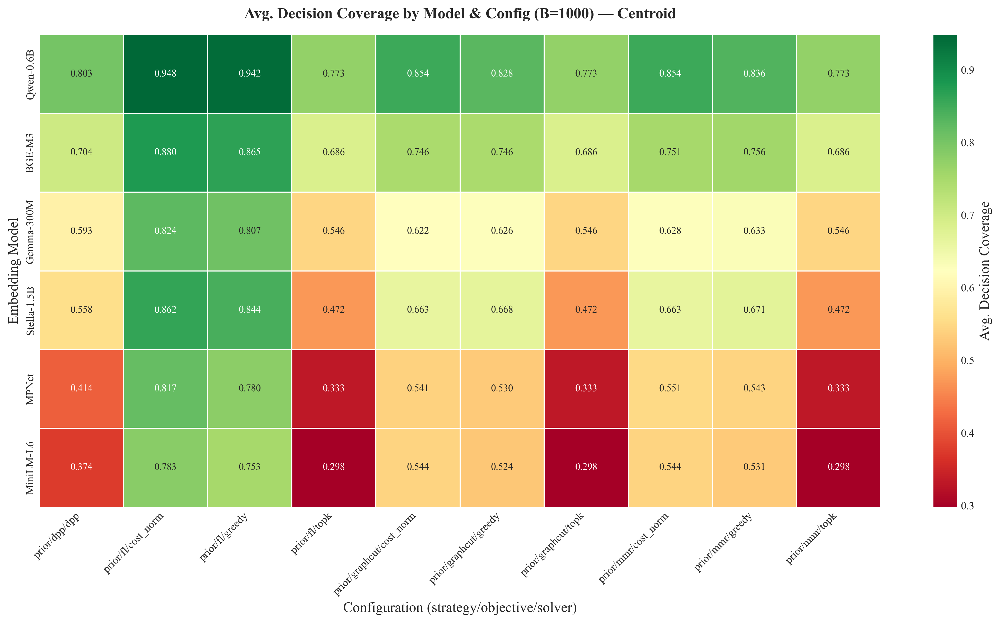

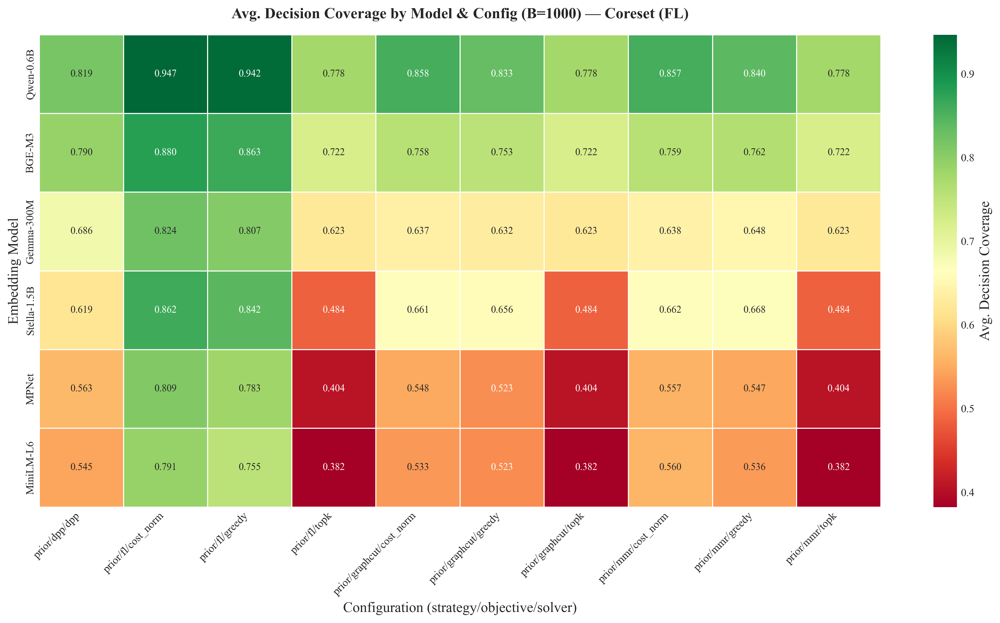

In [15]:
# ============================================================================
# PLOT 3: Model Heatmap - All Configurations (SORTED DESCENDING)
# ============================================================================
def plot_model_config_heatmap(df, metric, budget, prior_method=None, figsize=(14, 8)):
    """Heatmap showing model performance across all configurations (sorted by mean descending)."""
    data = df[df['budget'] == budget]
    if prior_method:
        data = data[data['prior_method'] == prior_method]
    
    pivot = data.pivot_table(
        index='model_short',
        columns='config',
        values=metric,
        aggfunc='mean'
    )
    
    # Sort by mean performance (descending - best at top)
    pivot = pivot.loc[pivot.mean(axis=1).sort_values(ascending=False).index]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    sns.heatmap(pivot, annot=True, fmt='.3f', cmap='RdYlGn', ax=ax,
                cbar_kws={'label': METRIC_NAMES.get(metric, metric)},
                annot_kws={'size': 9, 'weight': 'medium'}, linewidths=0.5, linecolor='white')
    
    title = f'{METRIC_NAMES.get(metric, metric)} by Model & Config (B={budget})'
    if prior_method:
        title += f' — {PRIOR_NAMES[prior_method]}'
    ax.set_title(title, pad=15, fontweight='bold')
    ax.set_xlabel('Configuration (strategy/objective/solver)', fontweight='medium')
    ax.set_ylabel('Embedding Model', fontweight='medium')
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    
    plt.tight_layout()
    return fig, ax

# Heatmaps for both prior methods at B=1000
for prior in ['centroid', 'coreset']:
    fig, ax = plot_model_config_heatmap(df, 'avg_decision_coverage', 1000, prior_method=prior)
    plt.savefig(FIGURES_DIR / f'model_heatmap_{prior}_B1000.pdf')
    plt.show()

solver       cost_norm       dpp    greedy      topk
model_short                                         
BGE-M3        0.792263  0.704135  0.788918  0.685655
Gemma-300M    0.691266  0.593346  0.688821  0.545838
MPNet         0.636400  0.414132  0.617665  0.333223
MiniLM-L6     0.623806  0.374255  0.602687  0.297783
Qwen-0.6B     0.885510  0.802533  0.868724  0.772834
Stella-1.5B   0.729339  0.558058  0.727668  0.471848


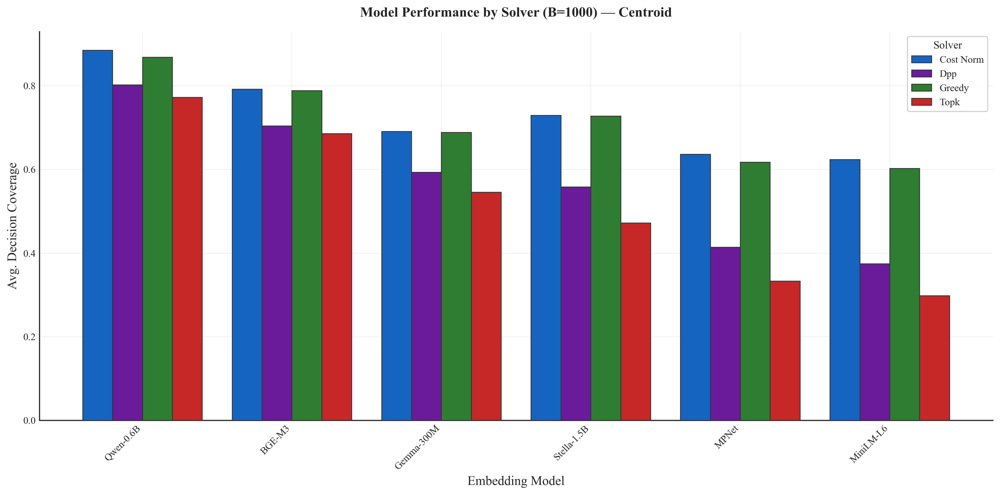

solver       cost_norm       dpp    greedy      topk
model_short                                         
BGE-M3        0.798729  0.790442  0.792621  0.722119
Gemma-300M    0.699668  0.686489  0.695362  0.622874
MPNet         0.637828  0.563428  0.617577  0.404241
MiniLM-L6     0.628174  0.545134  0.604570  0.382061
Qwen-0.6B     0.887258  0.818831  0.871729  0.778328
Stella-1.5B   0.728267  0.618895  0.721965  0.483648


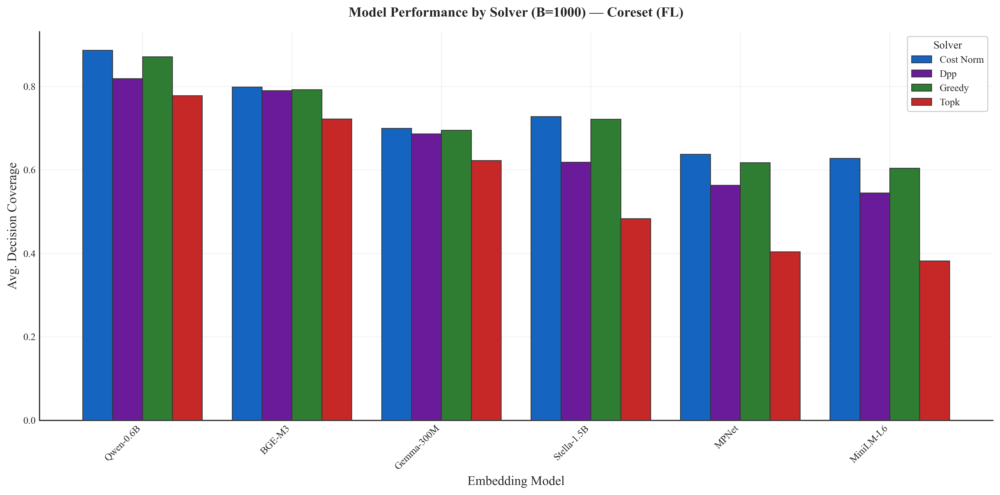

solver       cost_norm       dpp    greedy      topk
model_short                                         
BGE-M3        0.774956  0.672993  0.775065  0.653801
Gemma-300M    0.669793  0.552914  0.672338  0.509580
MPNet         0.634242  0.380989  0.614737  0.315722
MiniLM-L6     0.622751  0.339962  0.594971  0.278131
Qwen-0.6B     0.876381  0.786326  0.862974  0.753718
Stella-1.5B   0.710888  0.524219  0.709083  0.441687


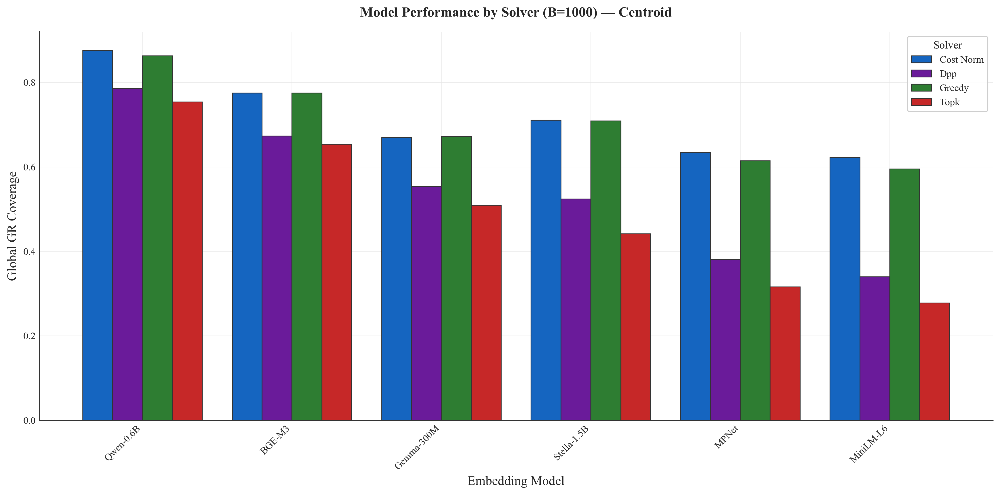

solver       cost_norm       dpp    greedy      topk
model_short                                         
BGE-M3        0.777909  0.762132  0.776112  0.693172
Gemma-300M    0.678044  0.648507  0.671176  0.589675
MPNet         0.629126  0.527806  0.611882  0.378108
MiniLM-L6     0.623641  0.513822  0.597819  0.351212
Qwen-0.6B     0.879478  0.801364  0.866081  0.758398
Stella-1.5B   0.710779  0.580463  0.705907  0.441988


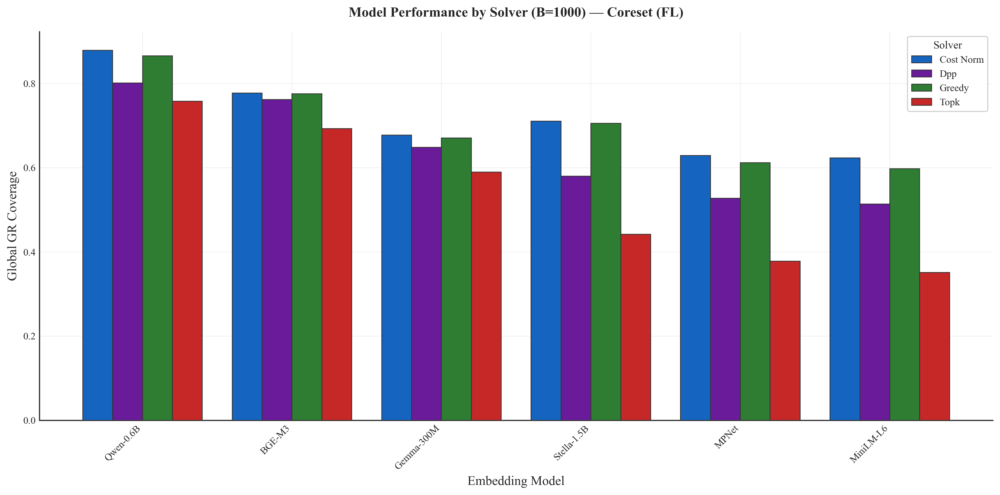

In [16]:
# ============================================================================
# PLOT 4: Model Performance by Solver (Grouped Bar) - SORTED DESCENDING
# ============================================================================
def plot_model_by_solver(df, metric, budget, prior_method=None, figsize=(14, 7)):
    """Grouped bar chart: models grouped by solver (sorted by mean performance descending)."""
    data = df[df['budget'] == budget]
    if prior_method:
        data = data[data['prior_method'] == prior_method]
    
    # Average across objectives for each model-solver pair
    grouped = data.groupby(['model_short', 'solver'])[metric].mean().unstack()
    print(grouped)
    
    # Sort models by their mean performance across solvers (descending)
    model_order = grouped.mean(axis=1).sort_values(ascending=False).index
    grouped = grouped.loc[model_order]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    x = np.arange(len(grouped.index))
    width = 0.2
    solvers = grouped.columns
    
    for i, solver in enumerate(solvers):
        offset = (i - len(solvers)/2 + 0.5) * width
        bars = ax.bar(x + offset, grouped[solver], width, 
                     label=solver.replace('_', ' ').title(),
                     color=SOLVER_COLORS.get(solver, f'C{i}'),
                     edgecolor='#333333', linewidth=0.8, zorder=3)
    
    ax.set_xlabel('Embedding Model', fontweight='medium')
    ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
    ax.set_xticks(x)
    ax.set_xticklabels(grouped.index, rotation=45, ha='right', fontweight='medium')
    
    title = f'Model Performance by Solver (B={budget})'
    if prior_method:
        title += f' — {PRIOR_NAMES[prior_method]}'
    ax.set_title(title, pad=15)
    ax.legend(title='Solver', loc='upper right', framealpha=0.95)
    
    plt.tight_layout()
    return fig, ax

# Model by solver at B=1000
for prior in ['centroid', 'coreset']:
    fig, ax = plot_model_by_solver(df, 'avg_decision_coverage', 1000, prior_method=prior)
    plt.savefig(FIGURES_DIR / f'model_by_solver_{prior}_B1000.pdf')
    plt.show()

for prior in ['centroid', 'coreset']:
    fig, ax = plot_model_by_solver(df, 'global_gr_coverage', 1000, prior_method=prior)
    plt.savefig(FIGURES_DIR / f'model_by_solver_{prior}_B1000.pdf')
    plt.show()


####################################################################################################
BUDGET = 1000
####################################################################################################


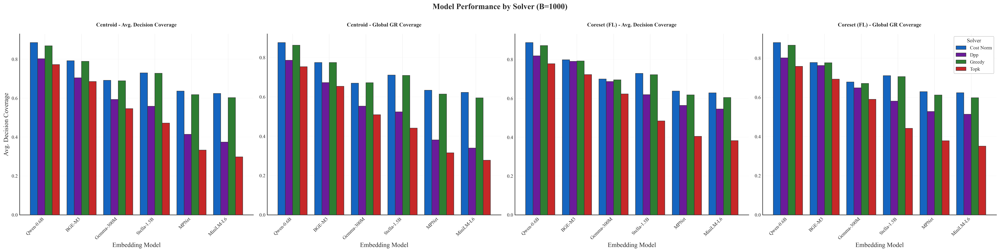


COMPREHENSIVE SOLVER COMPARISON (Budget=1000)

       Prior       Model    Solver Avg. Decision Coverage Global GR Coverage
    Centroid   Qwen-0.6B Cost Norm                 0.8855             0.8764
    Centroid   Qwen-0.6B       Dpp                 0.8025             0.7863
    Centroid   Qwen-0.6B    Greedy                 0.8687             0.8630
    Centroid   Qwen-0.6B      Topk                 0.7728             0.7537
    Centroid      BGE-M3 Cost Norm                 0.7923             0.7750
    Centroid      BGE-M3       Dpp                 0.7041             0.6730
    Centroid      BGE-M3    Greedy                 0.7889             0.7751
    Centroid      BGE-M3      Topk                 0.6857             0.6538
    Centroid  Gemma-300M Cost Norm                 0.6913             0.6698
    Centroid  Gemma-300M       Dpp                 0.5933             0.5529
    Centroid  Gemma-300M    Greedy                 0.6888             0.6723
    Centroid  Gemma-300M    

In [42]:
# ============================================================================
# PLOT 4: Model Performance by Solver - 1x4 Grid (All Side-by-Side)
# ============================================================================
def plot_model_by_solver_1x4(df, budget, figsize=(28, 7)):
    """Grouped bar chart: 1x4 grid showing all combinations."""
    
    fig, axes = plt.subplots(1, 4, figsize=figsize, sharey=False)
    
    prior_methods = ['centroid', 'coreset']
    metrics = [
        ('avg_decision_coverage', 'Avg. Decision Coverage'),
        ('global_gr_coverage', 'Global GR Coverage')
    ]
    
    plot_idx = 0
    for prior in prior_methods:
        for metric, metric_label in metrics:
            ax = axes[plot_idx]
            
            data = df[(df['budget'] == budget) & (df['prior_method'] == prior)]
            
            # Average across objectives for each model-solver pair
            grouped = data.groupby(['model_short', 'solver'])[metric].mean().unstack()
            
            # Sort models by mean performance (descending)
            model_order = grouped.mean(axis=1).sort_values(ascending=False).index
            grouped = grouped.loc[model_order]
            
            x = np.arange(len(grouped.index))
            width = 0.2
            solvers = grouped.columns
            
            for i, solver in enumerate(solvers):
                offset = (i - len(solvers)/2 + 0.5) * width
                bars = ax.bar(x + offset, grouped[solver], width, 
                             label=solver.replace('_', ' ').title(),
                             color=SOLVER_COLORS.get(solver, f'C{i}'),
                             edgecolor='#333333', linewidth=0.8, zorder=3)
            
            ax.set_xlabel('Embedding Model', fontweight='medium')
            if plot_idx == 0:
                ax.set_ylabel(metric_label, fontweight='medium')
            ax.set_xticks(x)
            ax.set_xticklabels(grouped.index, rotation=45, ha='right', fontweight='medium')
            ax.set_title(f'{PRIOR_NAMES[prior]} - {metric_label}', pad=15, fontweight='bold', fontsize=11)
            ax.grid(True, alpha=0.3, axis='y')
            
            # Legend only on last plot
            if plot_idx == 3:
                ax.legend(title='Solver', loc='upper right', framealpha=0.95)
            
            plot_idx += 1
    
    fig.suptitle(f'Model Performance by Solver (B={budget})', 
                 fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    return fig, axes


def generate_solver_comparison_table(df, metrics=['avg_decision_coverage', 'global_gr_coverage'], budget=1000, show_all_models=True):
    """Generate comprehensive table across all models, solvers, and prior methods."""
    
    print(f"\n{'='*160}")
    print(f"COMPREHENSIVE SOLVER COMPARISON (Budget={budget})")
    print(f"{'='*160}\n")
    
    table_data = []
    
    for prior in ['centroid', 'coreset']:
        data = df[(df['budget'] == budget) & (df['prior_method'] == prior)]
        
        if show_all_models:
            # All models
            grouped = data.groupby(['model_short', 'solver'])[metrics].mean().reset_index()
            model_perf = grouped.groupby('model_short')[metrics[0]].mean().sort_values(ascending=False)
            
            for model in model_perf.index:
                model_data = grouped[grouped['model_short'] == model]
                
                for _, row_data in model_data.iterrows():
                    row = {
                        'Prior': PRIOR_NAMES[prior],
                        'Model': model,
                        'Solver': row_data['solver'].replace('_', ' ').title(),
                    }
                    for metric in metrics:
                        row[METRIC_NAMES.get(metric, metric)] = f"{row_data[metric]:.4f}"
                    table_data.append(row)
        else:
            # Best model only
            best_model = data.groupby('model_short')[metrics[0]].mean().idxmax()
            model_data = data[data['model_short'] == best_model]
            grouped = model_data.groupby('solver')[metrics].mean().reset_index()
            
            for _, row_data in grouped.iterrows():
                row = {
                    'Prior': PRIOR_NAMES[prior],
                    'Model': best_model,
                    'Solver': row_data['solver'].replace('_', ' ').title(),
                }
                for metric in metrics:
                    row[METRIC_NAMES.get(metric, metric)] = f"{row_data[metric]:.4f}"
                table_data.append(row)
    
    table_df = pd.DataFrame(table_data)
    print(table_df.to_string(index=False))
    print(f"\n{'='*160}\n")
    
    return table_df


# Generate 1x4 plot for B=1000
print(f"\n{'#'*100}")
print(f"BUDGET = 1000")
print(f"{'#'*100}")

fig, axes = plot_model_by_solver_1x4(df, budget=1000)
plt.savefig(FIGURES_DIR / f'model_by_solver_1x4_B1000.pdf')
plt.show()

# Generate comprehensive table
solver_table = generate_solver_comparison_table(df, metrics=['avg_decision_coverage', 'global_gr_coverage'], 
                                               budget=1000, show_all_models=True)

print(f"\n✓ Saved solver comparison 1x4 plot to {FIGURES_DIR}")

# # Generate comprehensive table across all budgets
# def generate_comprehensive_solver_table(df, metric):
#     """Generate single comprehensive table across all budgets and prior methods."""
    
#     print(f"\n{'='*120}")
#     print(f"COMPREHENSIVE SOLVER COMPARISON: {METRIC_NAMES.get(metric, metric)}")
#     print(f"{'='*120}\n")
    
#     table_data = []
#     budgets = sorted(df['budget'].unique())
    
#     for prior in ['centroid', 'coreset']:
#         for budget in budgets:
#             data = df[(df['budget'] == budget) & (df['prior_method'] == prior)]
#             grouped = data.groupby(['model_short', 'solver'])[metric].mean().unstack()
            
#             # Get best model for this budget/prior
#             best_model = grouped.mean(axis=1).idxmax()
#             best_scores = grouped.loc[best_model]
            
#             row = {
#                 'Prior': PRIOR_NAMES[prior],
#                 'Budget': budget,
#                 'Best Model': best_model,
#             }
#             for solver in grouped.columns:
#                 row[solver.replace('_', ' ').title()] = f"{best_scores[solver]:.4f}"
            
#             row['Mean'] = f"{best_scores.mean():.4f}"
#             table_data.append(row)
    
#     table_df = pd.DataFrame(table_data)
#     print(table_df.to_string(index=False))
#     print(f"\n{'='*120}\n")
    
#     return table_df

# # Generate comprehensive tables
# table_avgdec = generate_comprehensive_solver_table(df, 'avg_decision_coverage')
# table_globalgr = generate_comprehensive_solver_table(df, 'global_gr_coverage')

In [21]:
def generate_comprehensive_solver_table(df, metrics=['avg_decision_coverage', 'global_gr_coverage'], budget=None, show_all_models=True):
    """
    Generate comprehensive table of solver performance across models, objectives, and prior methods.
    
    Args:
        df: DataFrame with results
        metrics: List of metrics to analyze (will appear as separate columns)
        budget: If specified, show only this budget. If None, show all budgets.
        show_all_models: If True, show all models. If False, show only best model per budget/prior.
    """
    
    print(f"\n{'='*160}")
    title = f"COMPREHENSIVE SOLVER COMPARISON"
    if budget:
        title += f" (Budget={budget})"
    print(title)
    print(f"{'='*160}\n")
    
    table_data = []
    budgets = [budget] if budget else sorted(df['budget'].unique())
    
    for prior in ['centroid', 'coreset']:
        for b in budgets:
            data = df[(df['budget'] == b) & (df['prior_method'] == prior)]
            
            if show_all_models:
                # Group by model, objective, solver - keep all combinations
                grouped = data.groupby(['model_short', 'objective', 'solver'])[metrics].mean().reset_index()
                
                # Sort by model performance on first metric
                model_perf = grouped.groupby('model_short')[metrics[0]].mean().sort_values(ascending=False)
                
                for model in model_perf.index:
                    model_data = grouped[grouped['model_short'] == model]
                    
                    for _, row_data in model_data.iterrows():
                        row = {
                            'Prior': PRIOR_NAMES[prior],
                            'Budget': b,
                            'Model': model,
                            'Objective': row_data['objective'].upper(),
                            'Solver': row_data['solver'].replace('_', ' ').title(),
                        }
                        # Add each metric as a column
                        for metric in metrics:
                            row[METRIC_NAMES.get(metric, metric)] = f"{row_data[metric]:.4f}"
                        table_data.append(row)
            else:
                # Best model only
                best_model = data.groupby('model_short')[metrics[0]].mean().idxmax()
                model_data = data[data['model_short'] == best_model]
                grouped = model_data.groupby(['objective', 'solver'])[metrics].mean().reset_index()
                
                for _, row_data in grouped.iterrows():
                    row = {
                        'Prior': PRIOR_NAMES[prior],
                        'Budget': b,
                        'Model': best_model,
                        'Objective': row_data['objective'].upper(),
                        'Solver': row_data['solver'].replace('_', ' ').title(),
                    }
                    # Add each metric as a column
                    for metric in metrics:
                        row[METRIC_NAMES.get(metric, metric)] = f"{row_data[metric]:.4f}"
                    table_data.append(row)
    
    table_df = pd.DataFrame(table_data)
    print(table_df.to_string(index=False))
    print(f"\n{'='*160}\n")
    
    return table_df

# Example usage - all models at B=1000 with both metrics
table_1000_all = generate_comprehensive_solver_table(df, 
                                                      metrics=['avg_decision_coverage', 'global_gr_coverage'], 
                                                      budget=1000, 
                                                      show_all_models=True)

# Example usage - best models across all budgets with both metrics
# table_best_all = generate_comprehensive_solver_table(df, 
#                                                       metrics=['avg_decision_coverage', 'global_gr_coverage'],
#                                                       budget=None, 
#                                                       show_all_models=False)


COMPREHENSIVE SOLVER COMPARISON (Budget=1000)

       Prior  Budget       Model Objective    Solver Avg. Decision Coverage Global GR Coverage
    Centroid    1000   Qwen-0.6B       DPP       Dpp                 0.8025             0.7863
    Centroid    1000   Qwen-0.6B        FL Cost Norm                 0.9484             0.9410
    Centroid    1000   Qwen-0.6B        FL    Greedy                 0.9419             0.9316
    Centroid    1000   Qwen-0.6B        FL      Topk                 0.7728             0.7537
    Centroid    1000   Qwen-0.6B  GRAPHCUT Cost Norm                 0.8538             0.8439
    Centroid    1000   Qwen-0.6B  GRAPHCUT    Greedy                 0.8278             0.8256
    Centroid    1000   Qwen-0.6B  GRAPHCUT      Topk                 0.7728             0.7537
    Centroid    1000   Qwen-0.6B       MMR Cost Norm                 0.8543             0.8442
    Centroid    1000   Qwen-0.6B       MMR    Greedy                 0.8365             0.8317
  

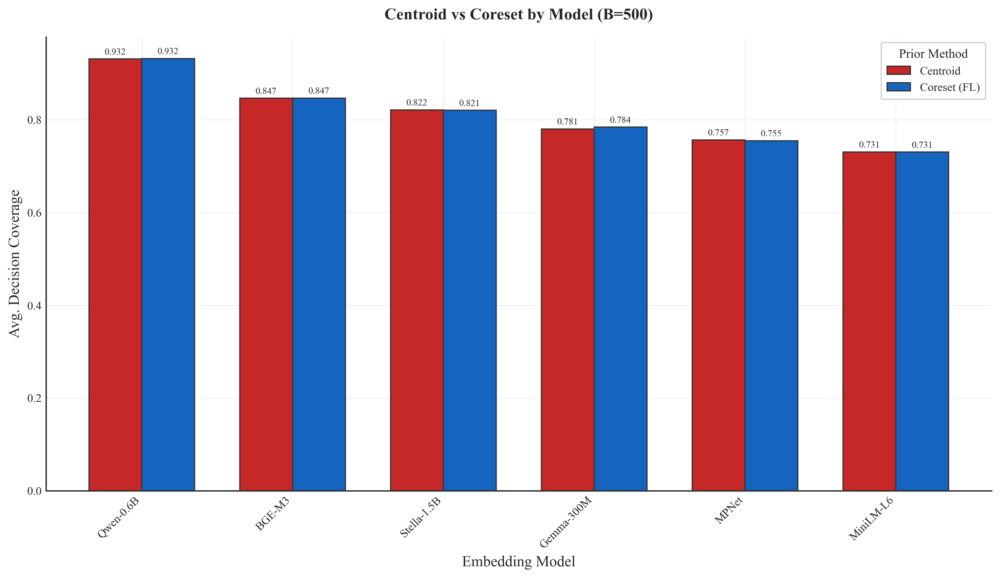

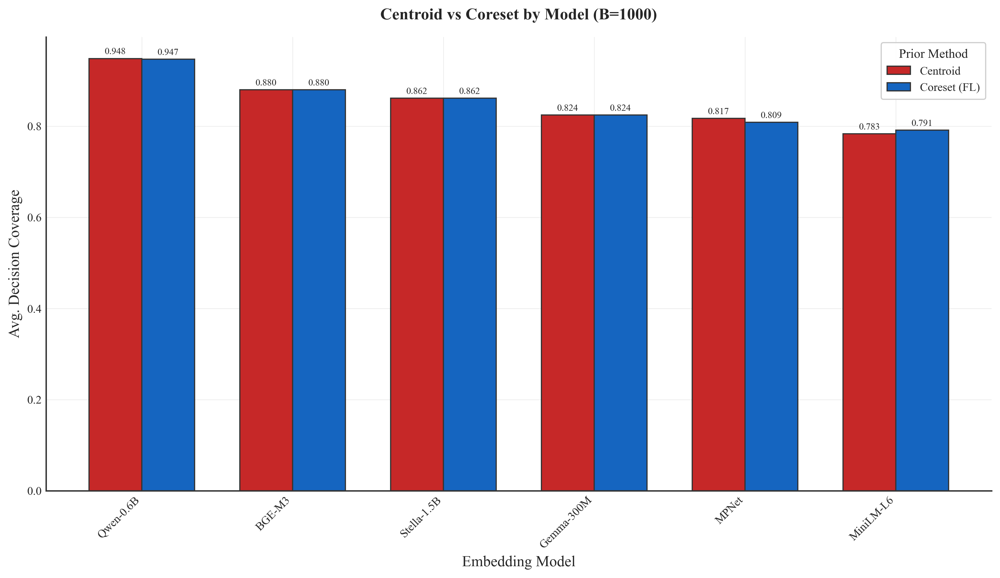

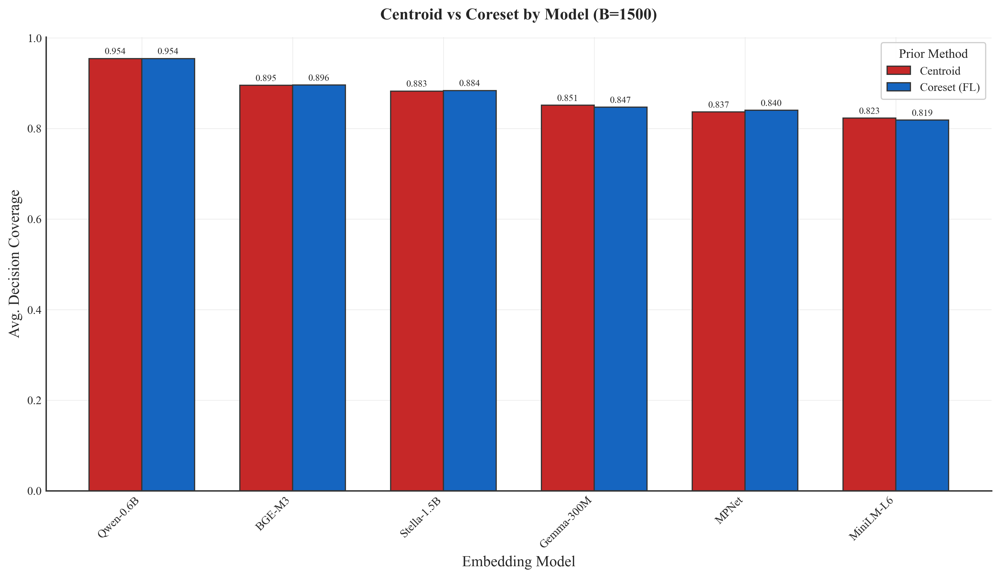

In [ ]:
# # ============================================================================
# # PLOT 6: Centroid vs Coreset per Model (Paired Bar) - SORTED DESCENDING
# # ============================================================================
# def plot_model_centroid_vs_coreset(df, metric, budget, figsize=(12, 7)):
#     """Paired bar chart comparing Centroid vs Coreset for each model (sorted by mean descending)."""
#     data = df[df['budget'] == budget]
    
#     # Get best performance per model and prior method
#     grouped = data.groupby(['model_short', 'prior_method'])[metric].max().unstack()
    
#     # Sort by mean of both methods (descending)
#     model_order = grouped.mean(axis=1).sort_values(ascending=False).index
#     grouped = grouped.loc[model_order]
    
#     fig, ax = plt.subplots(figsize=figsize)
    
#     x = np.arange(len(grouped.index))
#     width = 0.35
    
#     bars1 = ax.bar(x - width/2, grouped['centroid'], width, label='Centroid',
#                    color=PRIOR_COLORS['centroid'], edgecolor='#333333', linewidth=1, zorder=3)
#     bars2 = ax.bar(x + width/2, grouped['coreset'], width, label='Coreset (FL)',
#                    color=PRIOR_COLORS['coreset'], edgecolor='#333333', linewidth=1, zorder=3)
    
#     ax.set_xlabel('Embedding Model', fontweight='medium')
#     ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
#     ax.set_xticks(x)
#     ax.set_xticklabels(grouped.index, rotation=45, ha='right', fontweight='medium')
#     ax.set_title(f'Centroid vs Coreset by Model (B={budget})', pad=15)
#     ax.legend(title='Prior Method', framealpha=0.95)
    
#     # Add value labels with professional styling
#     for bar in bars1:
#         ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
#                 f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=8, fontweight='medium')
#     for bar in bars2:
#         ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
#                 f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=8, fontweight='medium')
    
#     plt.tight_layout()
#     return fig, ax

# # Compare at different budgets
# for budget in [500, 1000, 1500]:
#     fig, ax = plot_model_centroid_vs_coreset(df, 'avg_decision_coverage', budget)
#     plt.savefig(FIGURES_DIR / f'model_centroid_vs_coreset_B{budget}.pdf')
#     plt.show()

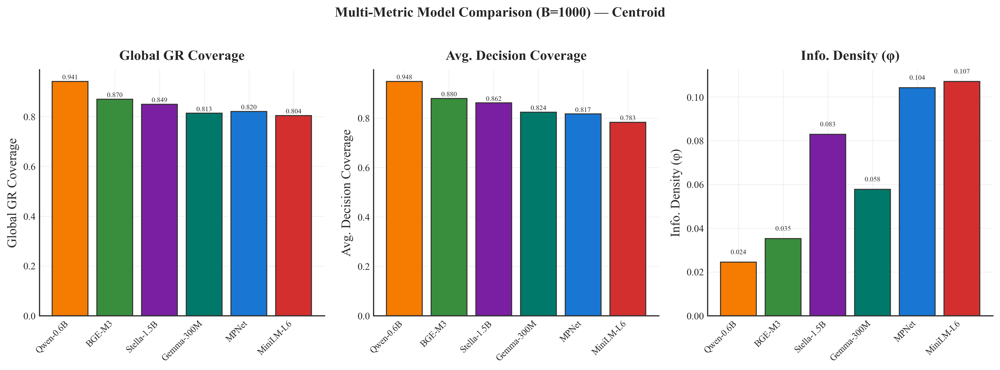

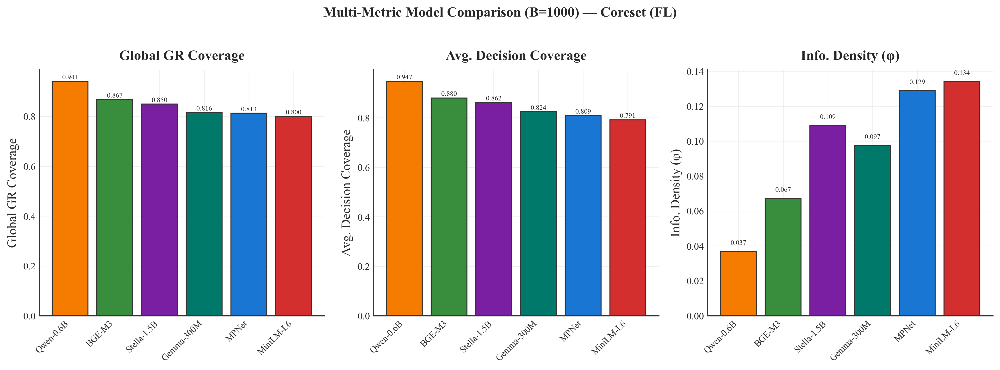

In [ ]:
# # ============================================================================
# # PLOT 7: Multi-Metric Model Comparison (Bar) - SORTED DESCENDING
# # ============================================================================
# def plot_model_multi_metric(df, budget, prior_method=None, figsize=(14, 5)):
#     """Bar chart showing multiple metrics for each model (sorted by coverage descending)."""
#     data = df[df['budget'] == budget]
#     if prior_method:
#         data = data[data['prior_method'] == prior_method]
    
#     metrics = ['global_gr_coverage', 'avg_decision_coverage', 'avg_density_phi']
    
#     # Get best performance per model for each metric
#     model_metrics = {}
#     for metric in metrics:
#         model_metrics[metric] = data.groupby('model_short')[metric].max()
    
#     # Sort models by avg_decision_coverage (primary metric) descending
#     model_order = model_metrics['avg_decision_coverage'].sort_values(ascending=False).index.tolist()
    
#     fig, axes = plt.subplots(1, 3, figsize=figsize)
    
#     for ax, metric in zip(axes, metrics):
#         # Get values in sorted order
#         values = [model_metrics[metric][m] for m in model_order]
#         colors = [MODEL_COLORS.get(m, '#333333') for m in model_order]
        
#         bars = ax.bar(range(len(model_order)), values, color=colors, 
#                       edgecolor='#333333', linewidth=1, zorder=3)
#         ax.set_xticks(range(len(model_order)))
#         ax.set_xticklabels(model_order, rotation=45, ha='right', fontsize=9, fontweight='medium')
#         ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
#         ax.set_title(METRIC_NAMES.get(metric, metric), fontweight='bold', pad=10)
        
#         # Add values on bars
#         for bar, val in zip(bars, values):
#             ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
#                     f'{val:.3f}', ha='center', va='bottom', fontsize=7, fontweight='medium')
    
#     title = f'Multi-Metric Model Comparison (B={budget})'
#     if prior_method:
#         title += f' — {PRIOR_NAMES[prior_method]}'
#     plt.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
#     plt.tight_layout()
#     return fig, axes

# # Multi-metric comparison
# for prior in ['centroid', 'coreset']:
#     fig, axes = plot_model_multi_metric(df, 1000, prior_method=prior)
#     plt.savefig(FIGURES_DIR / f'model_multi_metric_{prior}_B1000.pdf')
#     plt.show()

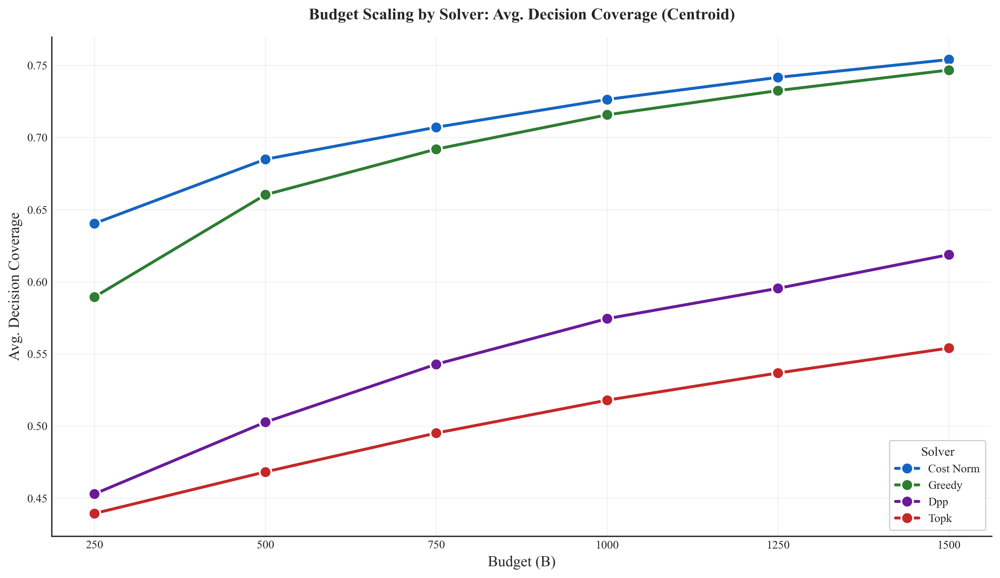

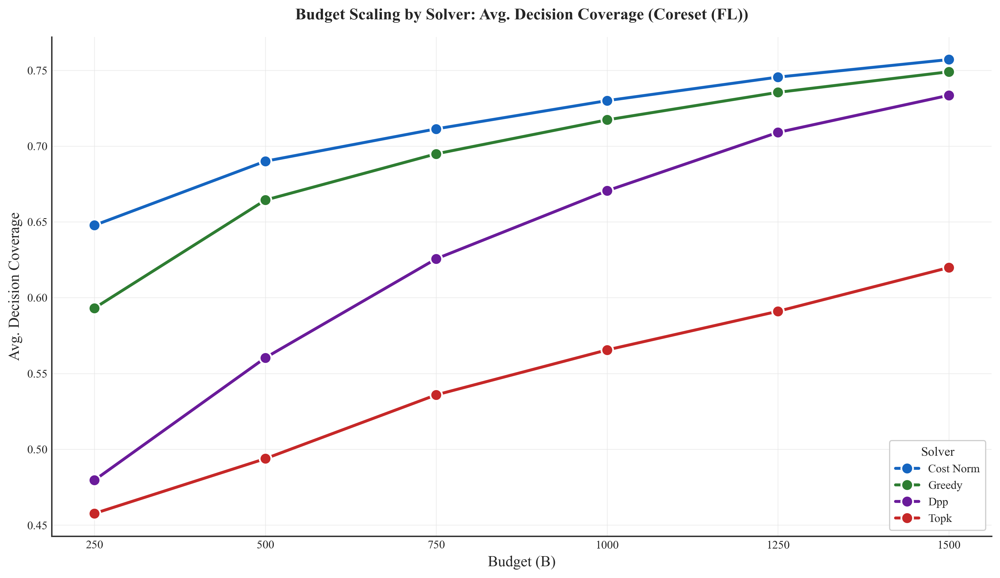

In [ ]:
# # ============================================================================
# # PLOT 8: Budget Scaling - All Prior Methods with Solvers
# # ============================================================================
# def plot_budget_scaling_by_solver(df, metric, prior_method=None, figsize=(12, 7)):
#     """Line plot showing budget scaling for each solver."""
#     data = df if prior_method is None else df[df['prior_method'] == prior_method]
    
#     # Average across models and objectives
#     grouped = data.groupby(['budget', 'solver'])[metric].mean().reset_index()
    
#     fig, ax = plt.subplots(figsize=figsize)
    
#     # Sort solvers by their max performance (for legend ordering)
#     solver_max = grouped.groupby('solver')[metric].max().sort_values(ascending=False)
    
#     for solver in solver_max.index:
#         solver_data = grouped[grouped['solver'] == solver]
#         color = SOLVER_COLORS.get(solver, '#333333')
        
#         ax.plot(solver_data['budget'], solver_data[metric], '-o',
#                 label=solver.replace('_', ' ').title(),
#                 color=color, linewidth=2.5, markersize=10, 
#                 markeredgecolor='white', markeredgewidth=1.5)
    
#     ax.set_xlabel('Budget (B)', fontweight='medium')
#     ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
#     title = f'Budget Scaling by Solver: {METRIC_NAMES.get(metric, metric)}'
#     if prior_method:
#         title += f' ({PRIOR_NAMES[prior_method]})'
#     ax.set_title(title, pad=15)
#     ax.legend(title='Solver', loc='lower right', framealpha=0.95)
#     ax.set_xticks(sorted(df['budget'].unique()))
    
#     plt.tight_layout()
#     return fig, ax

# # Budget scaling by solver
# for prior in ['centroid', 'coreset']:
#     fig, ax = plot_budget_scaling_by_solver(df, 'avg_decision_coverage', prior_method=prior)
#     plt.savefig(FIGURES_DIR / f'budget_scaling_solver_{prior}.pdf')
#     plt.show()

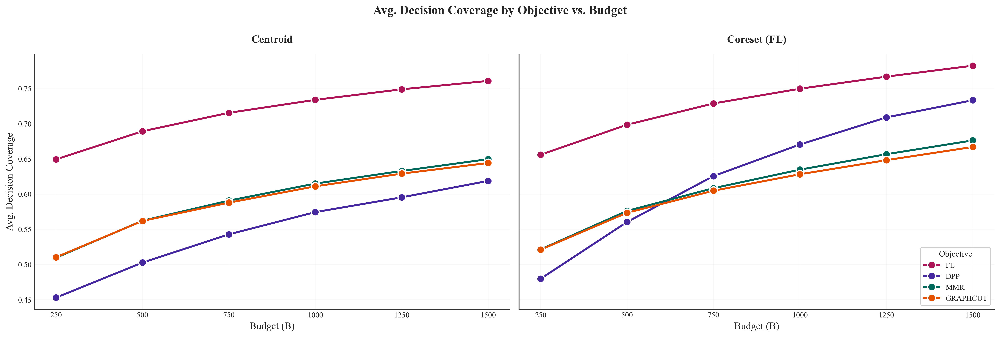


✓ Saved budget scaling by objective plot to figures_hires


In [20]:
# ============================================================================
# PLOT 9: Budget Scaling by Objective - Side-by-Side Comparison
# ============================================================================
def plot_budget_scaling_by_objective_sidebyside(df, metric, figsize=(18, 6)):
    """Line plot showing budget scaling for each objective, side-by-side for Centroid vs Coreset."""
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize, sharey=True)
    
    for idx, (ax, prior) in enumerate([(ax1, 'centroid'), (ax2, 'coreset')]):
        data = df[df['prior_method'] == prior]
        
        # Average across models and solvers
        grouped = data.groupby(['budget', 'objective'])[metric].mean().reset_index()
        
        # Sort objectives by max performance
        obj_max = grouped.groupby('objective')[metric].max().sort_values(ascending=False)
        
        for obj in obj_max.index:
            obj_data = grouped[grouped['objective'] == obj]
            color = OBJECTIVE_COLORS.get(obj, '#333333')
            
            ax.plot(obj_data['budget'], obj_data[metric], '-o',
                    label=obj.upper(), color=color, linewidth=2.5, markersize=10,
                    markeredgecolor='white', markeredgewidth=1.5)
        
        ax.set_xlabel('Budget (B)', fontweight='medium')
        if idx == 0:
            ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
        ax.set_title(PRIOR_NAMES[prior], pad=15, fontweight='bold')
        ax.set_xticks(sorted(df['budget'].unique()))
        ax.grid(True, alpha=0.3)
        
        if idx == 1:
            ax.legend(title='Objective', loc='lower right', framealpha=0.95)
    
    fig.suptitle(f'{METRIC_NAMES.get(metric, metric)} by Objective vs. Budget', 
                 fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    return fig, (ax1, ax2)

# Budget scaling by objective - side-by-side
fig, axes = plot_budget_scaling_by_objective_sidebyside(df, 'avg_decision_coverage')
plt.savefig(FIGURES_DIR / f'budget_scaling_objective_sidebyside.pdf')
plt.show()

print(f"\n✓ Saved budget scaling by objective plot to {FIGURES_DIR}")

    budget objective  global_gr_coverage
0      250       dpp            0.428243
1      250        fl            0.639419
2      250  graphcut            0.490504
3      250       mmr            0.489618
4      500       dpp            0.473987
5      500        fl            0.679038
6      500  graphcut            0.543684
7      500       mmr            0.543307
8      750       dpp            0.512331
9      750        fl            0.704300
10     750  graphcut            0.568704
11     750       mmr            0.570293
12    1000       dpp            0.542901
13    1000        fl            0.723220
14    1000  graphcut            0.593484
15    1000       mmr            0.595099
16    1250       dpp            0.565410
17    1250        fl            0.737049
18    1250  graphcut            0.611487
19    1250       mmr            0.613284
20    1500       dpp            0.587910
21    1500        fl            0.748092
22    1500  graphcut            0.625953
23    1500      

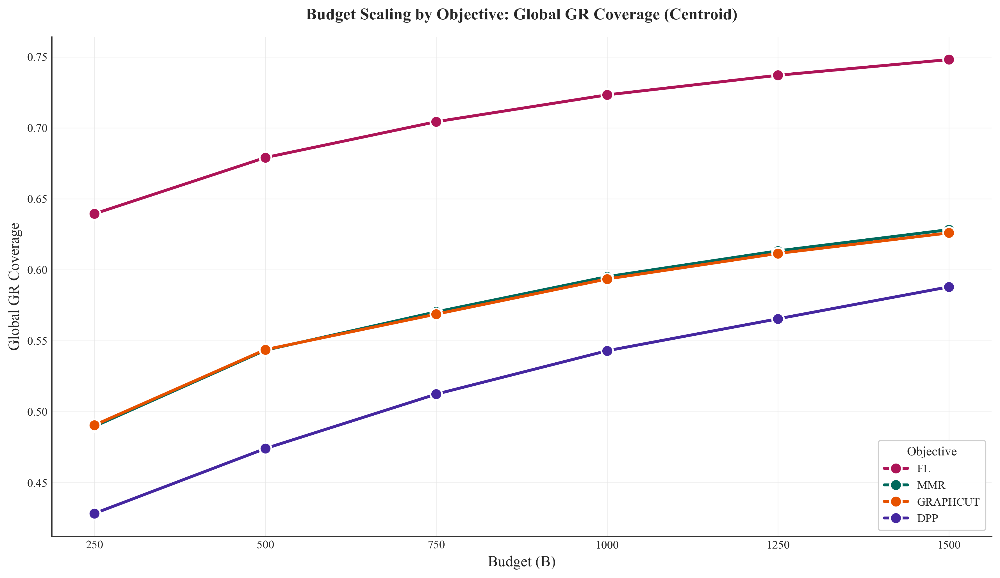

    budget objective  global_gr_coverage
0      250       dpp            0.453294
1      250        fl            0.646241
2      250  graphcut            0.500338
3      250       mmr            0.500596
4      500       dpp            0.531976
5      500        fl            0.688295
6      500  graphcut            0.554028
7      500       mmr            0.556149
8      750       dpp            0.595100
9      750        fl            0.715286
10     750  graphcut            0.583367
11     750       mmr            0.586045
12    1000       dpp            0.639015
13    1000        fl            0.736955
14    1000  graphcut            0.607569
15    1000       mmr            0.612228
16    1250       dpp            0.680839
17    1250        fl            0.755022
18    1250  graphcut            0.629638
19    1250       mmr            0.636164
20    1500       dpp            0.705636
21    1500        fl            0.768351
22    1500  graphcut            0.646901
23    1500      

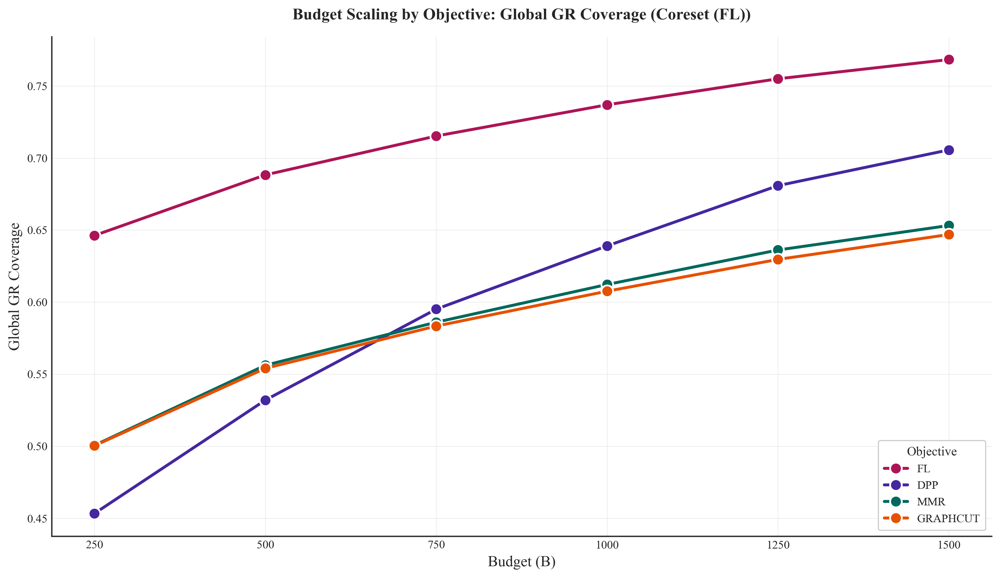

In [ ]:
# ============================================================================
# # PLOT 9: Budget Scaling by Objective
# # ============================================================================
# def plot_budget_scaling_by_objective(df, metric, prior_method=None, figsize=(12, 7)):
#     """Line plot showing budget scaling for each objective."""
#     data = df if prior_method is None else df[df['prior_method'] == prior_method]
    
#     # Average across models and solvers
#     grouped = data.groupby(['budget', 'objective'])[metric].mean().reset_index()
#     print(grouped)
    
#     fig, ax = plt.subplots(figsize=figsize)
    
#     # Sort objectives by their max performance (for legend ordering)
#     obj_max = grouped.groupby('objective')[metric].max().sort_values(ascending=False)
    
#     for obj in obj_max.index:
#         obj_data = grouped[grouped['objective'] == obj]
#         color = OBJECTIVE_COLORS.get(obj, '#333333')
        
#         ax.plot(obj_data['budget'], obj_data[metric], '-o',
#                 label=obj.upper(), color=color, linewidth=2.5, markersize=10,
#                 markeredgecolor='white', markeredgewidth=1.5)
    
#     ax.set_xlabel('Budget (B)', fontweight='medium')
#     ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
#     title = f'Budget Scaling by Objective: {METRIC_NAMES.get(metric, metric)}'
#     if prior_method:
#         title += f' ({PRIOR_NAMES[prior_method]})'
#     ax.set_title(title, pad=15)
#     ax.legend(title='Objective', loc='lower right', framealpha=0.95)
#     ax.set_xticks(sorted(df['budget'].unique()))
    
#     plt.tight_layout()
#     return fig, ax

# # Budget scaling by objective
# for prior in ['centroid', 'coreset']:
#     fig, ax = plot_budget_scaling_by_objective(df, 'global_gr_coverage', prior_method=prior)
#     plt.savefig(FIGURES_DIR / f'budget_scaling_objective_{prior}.pdf')
    plt.show()

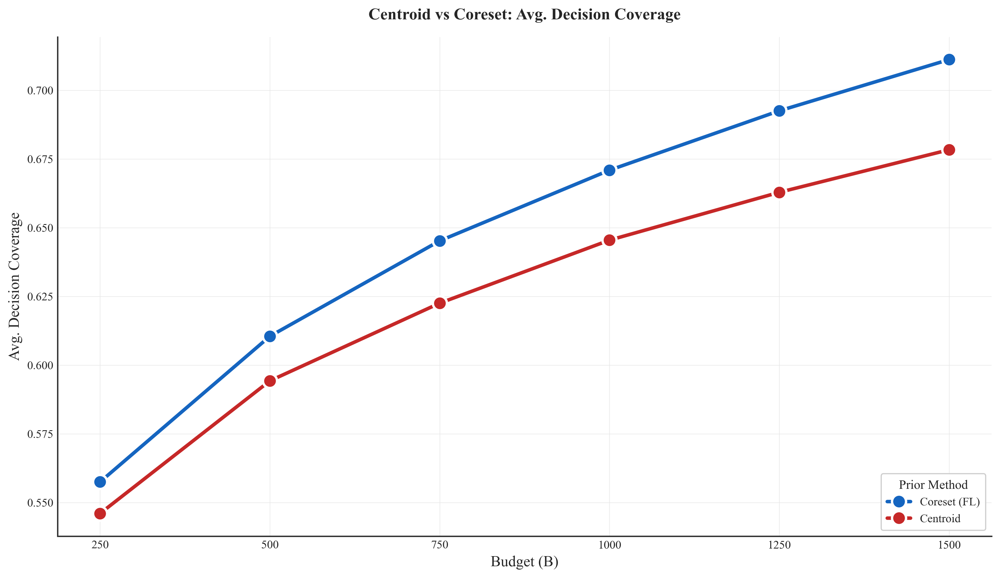

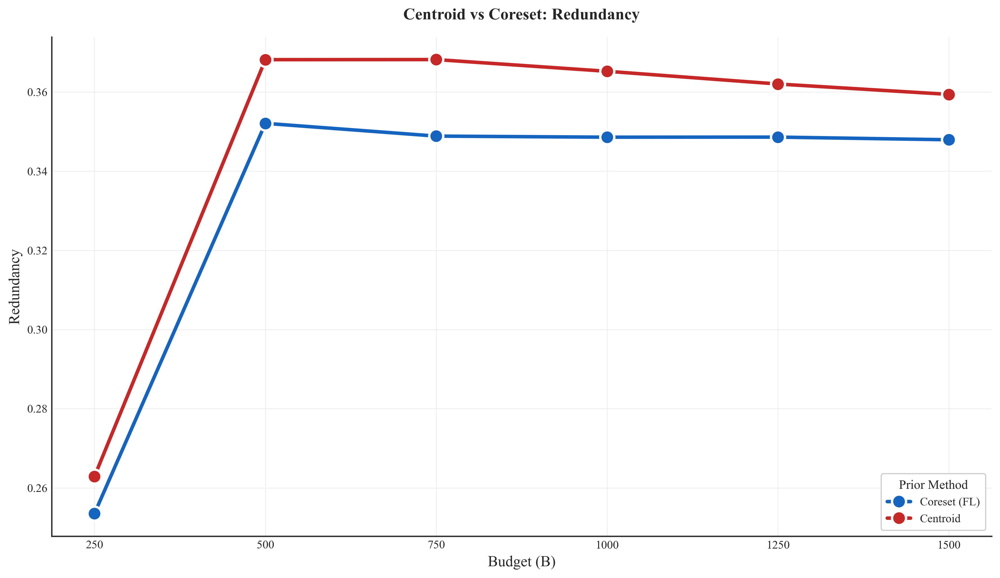

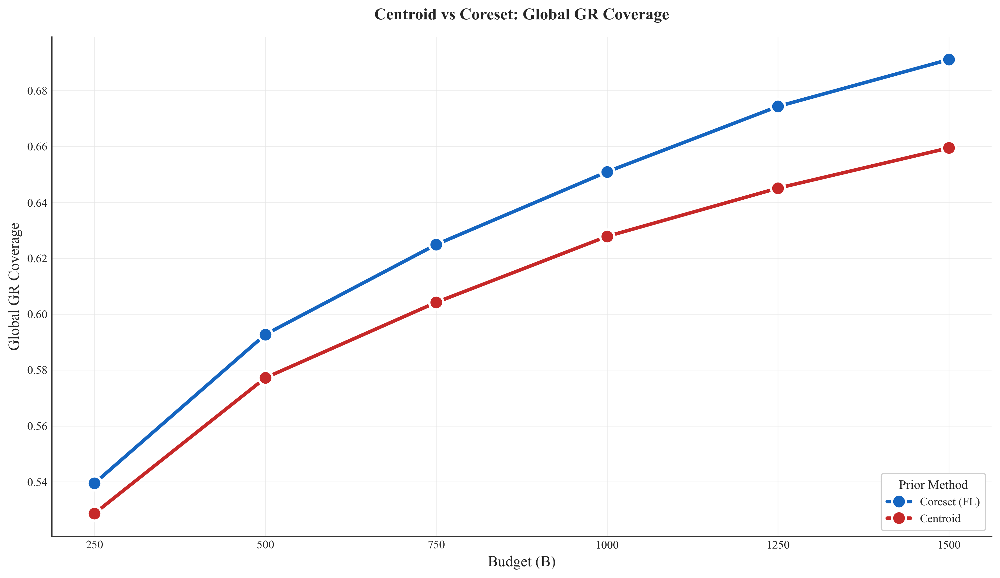

In [ ]:
# # ============================================================================
# # PLOT 10: Centroid vs Coreset Comparison (All Budgets)
# # ============================================================================
# def plot_centroid_vs_coreset_budget(df, metric, figsize=(12, 7)):
#     """Line plot comparing Centroid vs Coreset across all budgets."""
#     # Average across models, objectives, solvers
#     grouped = df.groupby(['budget', 'prior_method'])[metric].mean().reset_index()
    
#     fig, ax = plt.subplots(figsize=figsize)
    
#     for prior in ['coreset', 'centroid']:  # Order by performance
#         prior_data = grouped[grouped['prior_method'] == prior]
#         color = PRIOR_COLORS[prior]
#         label = PRIOR_NAMES[prior]
        
#         ax.plot(prior_data['budget'], prior_data[metric], '-o',
#                 label=label, color=color, linewidth=3, markersize=12,
#                 markeredgecolor='white', markeredgewidth=2)
    
#     ax.set_xlabel('Budget (B)', fontweight='medium')
#     ax.set_ylabel(METRIC_NAMES.get(metric, metric), fontweight='medium')
#     ax.set_title(f'Centroid vs Coreset: {METRIC_NAMES.get(metric, metric)}', pad=15)
#     ax.legend(title='Prior Method', loc='lower right', framealpha=0.95)
#     ax.set_xticks(sorted(df['budget'].unique()))
    
#     plt.tight_layout()
#     return fig, ax

# # Compare prior methods
# fig, ax = plot_centroid_vs_coreset_budget(df, 'avg_decision_coverage')
# plt.savefig(FIGURES_DIR / 'centroid_vs_coreset_coverage.pdf')
# plt.show()

# fig, ax = plot_centroid_vs_coreset_budget(df, 'redundancy_score')
# plt.savefig(FIGURES_DIR / 'centroid_vs_coreset_redundancy.pdf')
# plt.show()

# fig, ax = plot_centroid_vs_coreset_budget(df, 'global_gr_coverage')
# plt.savefig(FIGURES_DIR / 'centroid_vs_coreset_gr_coverage.pdf')
# plt.show()

In [23]:
# # ============================================================================
# # PLOT 11: Coverage vs Redundancy Trade-off (Scatter)
# # ============================================================================
# def plot_coverage_vs_redundancy(df, budget, figsize=(12, 7)):
#     """Scatter plot showing coverage-redundancy trade-off by solver."""
#     data = df[df['budget'] == budget]
    
#     fig, ax = plt.subplots(figsize=figsize)
    
#     # Sort solvers by their mean coverage (for legend ordering)
#     solver_order = data.groupby('solver')['avg_decision_coverage'].mean().sort_values(ascending=False).index
    
#     for solver in solver_order:
#         solver_data = data[data['solver'] == solver]
#         color = SOLVER_COLORS.get(solver, '#333333')
        
#         ax.scatter(solver_data['redundancy_score'], solver_data['avg_decision_coverage'],
#                    label=solver.replace('_', ' ').title(),
#                    color=color, s=120, alpha=0.75, edgecolors='#333333', linewidth=0.8, zorder=3)
    
#     ax.set_xlabel('Redundancy Score (lower is better)', fontweight='medium')
#     ax.set_ylabel('Avg. Decision Coverage (higher is better)', fontweight='medium')
#     ax.set_title(f'Coverage vs Redundancy Trade-off (B={budget})', pad=15)
#     ax.legend(title='Solver', framealpha=0.95)
    
#     plt.tight_layout()
#     return fig, ax

# # Trade-off plots
# for budget in [500, 1000, 1500]:
#     fig, ax = plot_coverage_vs_redundancy(df, budget)
#     plt.savefig(FIGURES_DIR / f'tradeoff_coverage_redundancy_B{budget}.pdf')
#     plt.show()

In [24]:
# # ============================================================================
# # PLOT 12: Decision Coverage Breakdown (D1-D5) per Model
# # Note: D1-D5 order is preserved (not sorted) as these are sequential decision nodes
# # ============================================================================
# def plot_decision_breakdown(df, budget, prior_method, model_short, figsize=(10, 6)):
#     """Bar chart showing D1-D5 decision coverage for a specific model."""
#     data = df[(df['budget'] == budget) & 
#               (df['prior_method'] == prior_method) & 
#               (df['model_short'] == model_short)]
    
#     # Get best config
#     best_idx = data['avg_decision_coverage'].idxmax()
#     best_row = data.loc[best_idx]
    
#     decisions = ['decision_D1_coverage', 'decision_D2_coverage', 'decision_D3_coverage',
#                  'decision_D4_coverage', 'decision_D5_coverage']
#     labels = ['D1', 'D2', 'D3', 'D4', 'D5']
#     values = [best_row[d] for d in decisions]
    
#     fig, ax = plt.subplots(figsize=figsize)
    
#     # Use sequential colormap for decision nodes
#     colors = [SEQUENTIAL_CMAP(0.3 + i * 0.14) for i in range(len(decisions))]
#     bars = ax.bar(labels, values, color=colors, edgecolor='#333333', linewidth=1.2, zorder=3)
    
#     ax.set_xlabel('Decision Node', fontweight='medium')
#     ax.set_ylabel('Coverage', fontweight='medium')
#     ax.set_title(f'{model_short}: Decision Coverage Breakdown\n(B={budget}, {PRIOR_NAMES[prior_method]}, {best_row["config"]})', 
#                  pad=15, fontweight='bold')
#     ax.set_ylim(0, 1)
    
#     # Add value labels with professional styling
#     for bar, val in zip(bars, values):
#         ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
#                 f'{val:.3f}', ha='center', va='bottom', fontsize=11, fontweight='medium')
    
#     plt.tight_layout()
#     return fig, ax

# # Decision breakdown for each model
# for model in df['model_short'].unique():
#     fig, ax = plot_decision_breakdown(df, 1000, 'coreset', model)
#     plt.savefig(FIGURES_DIR / f'decision_breakdown_{model.replace(" ", "_")}_B1000.pdf')
#     plt.show()

In [25]:
# ============================================================================
# CONSOLIDATED JSON: Best Baselines Analysis
# ============================================================================
def generate_best_baselines_json(df):
    """Generate a consolidated JSON with all best baseline comparisons."""
    
    results = {
        'summary': {
            'budgets': sorted(df['budget'].unique().tolist()),
            'prior_methods': df['prior_method'].unique().tolist(),
            'models': df['model'].unique().tolist(),
            'objectives': df['objective'].unique().tolist(),
            'solvers': df['solver'].unique().tolist(),
            'total_records': len(df)
        },
        'best_overall': {},
        'best_by_budget': {},
        'best_by_prior_method': {},
        'best_by_model': {},
        'model_rankings': {},
        'prior_method_comparison': {},
        'solver_comparison': {},
        'objective_comparison': {}
    }
    
    # 1. Best Overall Configuration
    best_idx = df['avg_decision_coverage'].idxmax()
    best_row = df.loc[best_idx]
    results['best_overall'] = {
        'prior_method': best_row['prior_method'],
        'model': best_row['model'],
        'budget': int(best_row['budget']),
        'config': best_row['config'],
        'objective': best_row['objective'],
        'solver': best_row['solver'],
        'avg_decision_coverage': float(best_row['avg_decision_coverage']),
        'global_gr_coverage': float(best_row['global_gr_coverage']),
        'redundancy_score': float(best_row['redundancy_score']),
        'avg_density_phi': float(best_row['avg_density_phi'])
    }
    
    # 2. Best by Budget
    for budget in sorted(df['budget'].unique()):
        budget_data = df[df['budget'] == budget]
        best_idx = budget_data['avg_decision_coverage'].idxmax()
        best_row = budget_data.loc[best_idx]
        results['best_by_budget'][str(budget)] = {
            'prior_method': best_row['prior_method'],
            'model': best_row['model'],
            'config': best_row['config'],
            'avg_decision_coverage': float(best_row['avg_decision_coverage']),
            'global_gr_coverage': float(best_row['global_gr_coverage']),
            'redundancy_score': float(best_row['redundancy_score'])
        }
    
    # 3. Best by Prior Method
    for prior in df['prior_method'].unique():
        prior_data = df[df['prior_method'] == prior]
        best_idx = prior_data['avg_decision_coverage'].idxmax()
        best_row = prior_data.loc[best_idx]
        results['best_by_prior_method'][prior] = {
            'model': best_row['model'],
            'budget': int(best_row['budget']),
            'config': best_row['config'],
            'avg_decision_coverage': float(best_row['avg_decision_coverage']),
            'global_gr_coverage': float(best_row['global_gr_coverage']),
            'redundancy_score': float(best_row['redundancy_score'])
        }
    
    # 4. Best by Model
    for model in df['model'].unique():
        model_data = df[df['model'] == model]
        best_idx = model_data['avg_decision_coverage'].idxmax()
        best_row = model_data.loc[best_idx]
        results['best_by_model'][model] = {
            'prior_method': best_row['prior_method'],
            'budget': int(best_row['budget']),
            'config': best_row['config'],
            'avg_decision_coverage': float(best_row['avg_decision_coverage']),
            'global_gr_coverage': float(best_row['global_gr_coverage']),
            'redundancy_score': float(best_row['redundancy_score'])
        }
    
    # 5. Model Rankings (by best coverage at each budget)
    for budget in sorted(df['budget'].unique()):
        budget_data = df[df['budget'] == budget]
        model_best = budget_data.groupby('model')['avg_decision_coverage'].max().sort_values(ascending=False)
        results['model_rankings'][str(budget)] = {
            model: {'rank': i+1, 'coverage': float(val)} 
            for i, (model, val) in enumerate(model_best.items())
        }
    
    # 6. Prior Method Comparison (aggregated)
    prior_comparison = df.groupby('prior_method').agg({
        'avg_decision_coverage': 'mean',
        'global_gr_coverage': 'mean',
        'redundancy_score': 'mean',
        'avg_density_phi': 'mean'
    }).to_dict()
    
    results['prior_method_comparison'] = {
        prior: {
            'avg_decision_coverage': float(prior_comparison['avg_decision_coverage'][prior]),
            'global_gr_coverage': float(prior_comparison['global_gr_coverage'][prior]),
            'redundancy_score': float(prior_comparison['redundancy_score'][prior]),
            'avg_density_phi': float(prior_comparison['avg_density_phi'][prior])
        } for prior in df['prior_method'].unique()
    }
    
    # Determine winner
    centroid_cov = results['prior_method_comparison']['centroid']['avg_decision_coverage']
    coreset_cov = results['prior_method_comparison']['coreset']['avg_decision_coverage']
    results['prior_method_comparison']['winner'] = 'coreset' if coreset_cov > centroid_cov else 'centroid'
    results['prior_method_comparison']['improvement_pct'] = float(abs(coreset_cov - centroid_cov) / centroid_cov * 100)
    
    # 7. Solver Comparison
    solver_comparison = df.groupby('solver').agg({
        'avg_decision_coverage': 'mean',
        'global_gr_coverage': 'mean',
        'redundancy_score': 'mean'
    })
    best_solver = solver_comparison['avg_decision_coverage'].idxmax()
    
    results['solver_comparison'] = {
        solver: {
            'avg_decision_coverage': float(solver_comparison.loc[solver, 'avg_decision_coverage']),
            'global_gr_coverage': float(solver_comparison.loc[solver, 'global_gr_coverage']),
            'redundancy_score': float(solver_comparison.loc[solver, 'redundancy_score'])
        } for solver in df['solver'].unique()
    }
    results['solver_comparison']['winner'] = best_solver
    
    # 8. Objective Comparison
    obj_comparison = df.groupby('objective').agg({
        'avg_decision_coverage': 'mean',
        'global_gr_coverage': 'mean',
        'redundancy_score': 'mean'
    })
    best_obj = obj_comparison['avg_decision_coverage'].idxmax()
    
    results['objective_comparison'] = {
        obj: {
            'avg_decision_coverage': float(obj_comparison.loc[obj, 'avg_decision_coverage']),
            'global_gr_coverage': float(obj_comparison.loc[obj, 'global_gr_coverage']),
            'redundancy_score': float(obj_comparison.loc[obj, 'redundancy_score'])
        } for obj in df['objective'].unique()
    }
    results['objective_comparison']['winner'] = best_obj
    
    return results

# Generate and save JSON
best_baselines = generate_best_baselines_json(df)

# Save to file
with open('best_baselines.json', 'w') as f:
    json.dump(best_baselines, f, indent=2)

print("="*80)
print("BEST BASELINES JSON GENERATED: best_baselines.json")
print("="*80)
print(json.dumps(best_baselines, indent=2))

BEST BASELINES JSON GENERATED: best_baselines.json
{
  "summary": {
    "budgets": [
      250,
      500,
      750,
      1000,
      1250,
      1500
    ],
    "prior_methods": [
      "centroid",
      "coreset"
    ],
    "models": [
      "BAAI/bge-m3",
      "NovaSearch/stella_en_1.5B_v5",
      "all-MiniLM-L6-v2",
      "google/embeddinggemma-300m",
      "Qwen/Qwen3-Embedding-0.6B",
      "all-mpnet-base-v2"
    ],
    "objectives": [
      "mmr",
      "graphcut",
      "fl",
      "dpp"
    ],
    "solvers": [
      "greedy",
      "cost_norm",
      "dpp",
      "topk"
    ],
    "total_records": 720
  },
  "best_overall": {
    "prior_method": "coreset",
    "model": "Qwen/Qwen3-Embedding-0.6B",
    "budget": 1500,
    "config": "prior/fl/cost_norm",
    "objective": "fl",
    "solver": "cost_norm",
    "avg_decision_coverage": 0.954353021242383,
    "global_gr_coverage": 0.9500974374453508,
    "redundancy_score": 0.6878479398646444,
    "avg_density_phi": 0.022090583196

In [26]:
# ============================================================================
# FINAL SUMMARY: List all generated figures
# ============================================================================
print("="*80)
print("ALL HIGH-RESOLUTION FIGURES GENERATED")
print("="*80)

figures_list = sorted(FIGURES_DIR.glob('*.pdf'))
print(f"\nTotal figures: {len(figures_list)}")
print(f"Directory: {FIGURES_DIR.absolute()}")
print("\nFigures:")
for i, fig_path in enumerate(figures_list, 1):
    print(f"  {i:2d}. {fig_path.name}")

print("\n" + "="*80)
print("JSON OUTPUT")
print("="*80)
print("  - best_baselines.json")

print("\n" + "="*80)
print("ANALYSIS COMPLETE")
print("="*80)

ALL HIGH-RESOLUTION FIGURES GENERATED

Total figures: 69
Directory: /Users/vedumrajkar/Desktop/budgeted-ret/figures_hires

Figures:
   1. budget_scaling_objective_centroid.pdf
   2. budget_scaling_objective_coreset.pdf
   3. budget_scaling_objective_kmeans.pdf
   4. budget_scaling_solver_centroid.pdf
   5. budget_scaling_solver_coreset.pdf
   6. budget_scaling_solver_kmeans.pdf
   7. centroid_vs_coreset_coverage.pdf
   8. centroid_vs_coreset_gr_coverage.pdf
   9. centroid_vs_coreset_redundancy.pdf
  10. decision_breakdown_BGE-M3_B1000.pdf
  11. decision_breakdown_Gemma-300M_B1000.pdf
  12. decision_breakdown_MPNet_B1000.pdf
  13. decision_breakdown_MiniLM-L6_B1000.pdf
  14. decision_breakdown_Qwen-0.6B_B1000.pdf
  15. decision_breakdown_Stella-1.5B_B1000.pdf
  16. filter_centroid_vs_coreset_dec_coverage.pdf
  17. filter_centroid_vs_coreset_gr_coverage.pdf
  18. filter_dec_coverage_by_model.pdf
  19. filter_efficiency_combined.pdf
  20. filter_efficiency_dec_coverage.pdf
  21. filter_ef

In [27]:
df.columns

Index(['budget', 'model', 'prior_method', 'strategy', 'objective', 'solver',
       'config', 'avg_decision_coverage', 'avg_density_phi',
       'decision_D1_coverage', 'decision_D2_coverage', 'decision_D3_coverage',
       'decision_D4_coverage', 'decision_D5_coverage', 'global_gr_coverage',
       'redundancy_score', 'semantic_volume', 'model_short', 'prior_display'],
      dtype='object')

In [28]:
df[df['model_short'] == 'Qwen-0.6B']['global_gr_coverage'].mean()


0.8165938540898049

## 8. Corpus Filtering Experiment

Analyze the impact of pre-filtering the corpus to the top-k% by importance score before running selection. Compares coverage degradation across all embedding models and both prior methods (Centroid vs Coreset).

In [35]:
# ============================================================================
# Load filter experiment results
# ============================================================================
df_filter = pd.read_csv("filter_experiment_results.csv")

# Add short model names
df_filter['model_short'] = df_filter['model'].map(lambda x: MODEL_SHORT_NAMES.get(x, x))
df_filter['prior_display'] = df_filter['prior_method'].map(lambda x: PRIOR_NAMES.get(x, x))
df_filter['prior_method'] = df_filter['prior_method'].replace('kmeans', 'centroid')


print(f"Filter experiment records: {len(df_filter)}")
print(f"Models: {df_filter['model_short'].unique().tolist()}")
print(f"Prior methods: {df_filter['prior_method'].unique().tolist()}")
print(f"Retention levels: {sorted(df_filter['retain_pct'].unique().tolist())}")
print(f"Papers per model: {df_filter.groupby('model_short')['paper_id'].nunique().to_dict()}")
df_filter.head(10)

Filter experiment records: 15264
Models: ['Gemma-300M', 'MiniLM-L6', 'MPNet', 'BGE-M3', 'Stella-1.5B', 'Qwen-0.6B']
Prior methods: ['centroid', 'coreset']
Retention levels: [0.03, 0.05, 0.1, 0.2, 0.5, 1.0]
Papers per model: {'BGE-M3': 212, 'Gemma-300M': 212, 'MPNet': 212, 'MiniLM-L6': 212, 'Qwen-0.6B': 212, 'Stella-1.5B': 212}


,model,prior_method,paper_id,retain_pct,retain_pct_display,num_units,gr_coverage,avg_dec_coverage,oracle_retention,selected_count,model_short,prior_display
0,google/embeddinggemma-300m,centroid,1023_slides.pdf,1.00,100%,153,0.697458,0.603813,1.000000,8,Gemma-300M,kmeans
1,google/embeddinggemma-300m,centroid,1023_slides.pdf,0.03,3%,4,0.334309,0.453666,0.125000,4,Gemma-300M,kmeans
2,google/embeddinggemma-300m,centroid,1023_slides.pdf,0.05,5%,7,0.402616,0.496567,0.125000,6,Gemma-300M,kmeans
3,google/embeddinggemma-300m,centroid,1023_slides.pdf,0.10,10%,15,0.400645,0.528323,0.250000,6,Gemma-300M,kmeans
4,google/embeddinggemma-300m,centroid,1023_slides.pdf,0.20,20%,30,0.552883,0.646170,0.500000,7,Gemma-300M,kmeans
5,google/embeddinggemma-300m,centroid,1023_slides.pdf,0.50,50%,76,0.713232,0.592373,0.875000,6,Gemma-300M,kmeans
6,google/embeddinggemma-300m,centroid,1017_slides.pdf,1.00,100%,192,0.701555,0.589063,1.000000,7,Gemma-300M,kmeans
7,google/embeddinggemma-300m,centroid,1017_slides.pdf,0.03,3%,5,0.587186,0.527156,0.142857,4,Gemma-300M,kmeans
8,google/embeddinggemma-300m,centroid,1017_slides.pdf,0.05,5%,9,0.704569,0.583273,0.142857,5,Gemma-300M,kmeans
9,google/embeddinggemma-300m,centroid,1017_slides.pdf,0.10,10%,19,0.727991,0.643661,0.142857,6,Gemma-300M,kmeans


In [36]:
# ============================================================================
# Aggregate filter results
# ============================================================================
df_filter_agg = df_filter.groupby(['model', 'model_short', 'prior_method', 'prior_display', 'retain_pct']).agg(
    gr_coverage=('gr_coverage', 'mean'),
    avg_dec_coverage=('avg_dec_coverage', 'mean'),
    oracle_retention=('oracle_retention', 'mean'),
    num_units=('num_units', 'mean'),
    selected_count=('selected_count', 'mean'),
    num_papers=('paper_id', 'nunique'),
).reset_index()

df_filter_agg['retain_pct_display'] = (df_filter_agg['retain_pct'] * 100).astype(int).astype(str) + '%'

print(f"✓ Aggregated filter records: {len(df_filter_agg)}")
print(f"✓ Prior methods: {df_filter_agg['prior_method'].unique().tolist()}")
df_filter_agg.head(15)

✓ Aggregated filter records: 72
✓ Prior methods: ['centroid', 'coreset']


,model,model_short,prior_method,prior_display,retain_pct,gr_coverage,avg_dec_coverage,oracle_retention,num_units,selected_count,num_papers,retain_pct_display
0,BAAI/bge-m3,BGE-M3,centroid,kmeans,0.03,0.604037,0.635190,0.193359,4.877358,4.113208,212,3%
1,BAAI/bge-m3,BGE-M3,centroid,kmeans,0.05,0.640254,0.670890,0.216747,8.518868,4.966981,212,5%
2,BAAI/bge-m3,BGE-M3,centroid,kmeans,0.10,0.681740,0.714542,0.298093,17.603774,5.386792,212,10%
3,BAAI/bge-m3,BGE-M3,centroid,kmeans,0.20,0.714520,0.745309,0.415512,35.669811,5.660377,212,20%
4,BAAI/bge-m3,BGE-M3,centroid,kmeans,0.50,0.739897,0.757634,0.698555,89.849057,5.721698,212,50%
5,BAAI/bge-m3,BGE-M3,centroid,kmeans,1.00,0.739301,0.753108,1.000000,180.198113,5.750000,212,100%
6,BAAI/bge-m3,BGE-M3,coreset,Coreset (FL),0.03,0.653466,0.683668,0.211480,4.877358,4.113208,212,3%
7,BAAI/bge-m3,BGE-M3,coreset,Coreset (FL),0.05,0.700628,0.732740,0.237069,8.518868,5.056604,212,5%
8,BAAI/bge-m3,BGE-M3,coreset,Coreset (FL),0.10,0.754715,0.781493,0.277278,17.603774,5.537736,212,10%
9,BAAI/bge-m3,BGE-M3,coreset,Coreset (FL),0.20,0.760475,0.786227,0.398100,35.669811,5.655660,212,20%


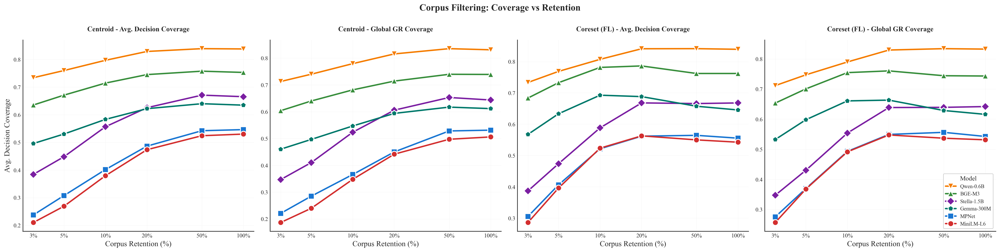


✓ Saved 1x4 filter coverage plot to figures_hires


In [41]:
# ============================================================================
# PLOT F1: Coverage vs Corpus Retention — 1x4 Grid (All Side-by-Side)
# ============================================================================
def plot_filter_coverage_1x4(df_agg, figsize=(24, 6)):
    """1x4 grid: all 4 combinations side-by-side."""
    
    fig, axes = plt.subplots(1, 4, figsize=figsize, sharey=False)
    
    prior_methods = ['centroid', 'coreset']
    metrics = [
        ('avg_dec_coverage', 'Avg. Decision Coverage'),
        ('gr_coverage', 'Global GR Coverage')
    ]
    
    plot_idx = 0
    for prior in prior_methods:
        data = df_agg[df_agg['prior_method'] == prior]
        
        for metric, metric_label in metrics:
            ax = axes[plot_idx]
            
            # Filter out zero retention
            plot_data = data[data['retain_pct'] > 0]
            grouped = plot_data.groupby(['model_short', 'retain_pct'])[metric].mean().reset_index()
            
            # Sort models by oracle performance
            oracle_data = grouped[grouped['retain_pct'] == 1.0]
            if len(oracle_data) > 0:
                oracle_perf = oracle_data.set_index('model_short')[metric].sort_values(ascending=False)
            else:
                oracle_perf = grouped.groupby('model_short')[metric].max().sort_values(ascending=False)
            
            for model in oracle_perf.index:
                mdata = grouped[grouped['model_short'] == model].sort_values('retain_pct')
                if len(mdata) == 0:
                    continue
                
                color = MODEL_COLORS.get(model, '#333333')
                marker = MODEL_MARKERS.get(model, 'o')
                ax.plot(mdata['retain_pct'] * 100, mdata[metric], '-',
                        marker=marker, label=model, color=color,
                        linewidth=2.5, markersize=10, markeredgecolor='white', markeredgewidth=1.5)
            
            # Labels and title
            ax.set_xlabel('Corpus Retention (%)', fontweight='medium')
            if plot_idx == 0:
                ax.set_ylabel(metric_label, fontweight='medium')
            ax.set_title(f'{PRIOR_NAMES[prior]} - {metric_label}', pad=15, fontweight='bold', fontsize=12)
            
            # Log scale
            retention_values = sorted(plot_data['retain_pct'].unique() * 100)
            ax.set_xscale('log')
            ax.set_xticks(retention_values)
            ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}%'))
            ax.grid(True, alpha=0.3)
            
            # Legend only on last plot
            if plot_idx == 3:
                ax.legend(title='Model', loc='lower right', ncol=1, framealpha=0.95, fontsize=9)
            
            plot_idx += 1
    
    fig.suptitle('Corpus Filtering: Coverage vs Retention', fontsize=16, fontweight='bold', y=1.00)
    plt.tight_layout()
    return fig, axes

# Generate 1x4 plot
fig, axes = plot_filter_coverage_1x4(df_filter_agg)
plt.savefig(FIGURES_DIR / 'filter_coverage_1x4_all.pdf')
plt.show()

print(f"\n✓ Saved 1x4 filter coverage plot to {FIGURES_DIR}")

In [40]:
# ============================================================================
# Table: Coverage at Different Retention Levels
# ============================================================================
def generate_filter_coverage_table(df_agg):
    """Generate table showing coverage at different retention levels for all models and prior methods."""
    
    print("\n" + "="*140)
    print("CORPUS FILTERING: COVERAGE AT DIFFERENT RETENTION LEVELS")
    print("="*140 + "\n")
    
    retention_levels = sorted(df_agg['retain_pct'].unique())
    table_data = []
    
    for prior in ['centroid', 'coreset']:
        prior_data = df_agg[df_agg['prior_method'] == prior]
        
        for model in sorted(df_agg['model_short'].unique()):
            model_data = prior_data[prior_data['model_short'] == model]
            
            row = {
                'Prior': PRIOR_NAMES[prior],
                'Model': model,
            }
            
            for retention in retention_levels:
                ret_data = model_data[model_data['retain_pct'] == retention]
                if len(ret_data) > 0:
                    avg_dec = ret_data['avg_dec_coverage'].values[0]
                    gr_cov = ret_data['gr_coverage'].values[0]
                    row[f'{int(retention*100)}%'] = f"{avg_dec:.3f} / {gr_cov:.3f}"
                else:
                    row[f'{int(retention*100)}%'] = "N/A"
            
            table_data.append(row)
    
    table_df = pd.DataFrame(table_data)
    print(table_df.to_string(index=False))
    print("\nFormat: Avg Decision Coverage / Global GR Coverage")
    print("="*140 + "\n")
    
    return table_df

# Generate comprehensive table
filter_table = generate_filter_coverage_table(df_filter_agg)


CORPUS FILTERING: COVERAGE AT DIFFERENT RETENTION LEVELS

       Prior       Model            3%            5%           10%           20%           50%          100%
    Centroid      BGE-M3 0.635 / 0.604 0.671 / 0.640 0.715 / 0.682 0.745 / 0.715 0.758 / 0.740 0.753 / 0.739
    Centroid  Gemma-300M 0.496 / 0.460 0.530 / 0.497 0.583 / 0.547 0.622 / 0.594 0.640 / 0.617 0.635 / 0.612
    Centroid       MPNet 0.237 / 0.221 0.307 / 0.285 0.402 / 0.366 0.486 / 0.450 0.542 / 0.528 0.546 / 0.531
    Centroid   MiniLM-L6 0.210 / 0.187 0.269 / 0.240 0.379 / 0.348 0.474 / 0.442 0.524 / 0.497 0.530 / 0.506
    Centroid   Qwen-0.6B 0.734 / 0.713 0.760 / 0.740 0.797 / 0.780 0.829 / 0.816 0.839 / 0.836 0.838 / 0.831
    Centroid Stella-1.5B 0.384 / 0.347 0.448 / 0.410 0.557 / 0.524 0.625 / 0.606 0.671 / 0.653 0.665 / 0.644
Coreset (FL)      BGE-M3 0.684 / 0.653 0.733 / 0.701 0.781 / 0.755 0.786 / 0.760 0.762 / 0.744 0.762 / 0.743
Coreset (FL)  Gemma-300M 0.568 / 0.532 0.633 / 0.598 0.693 / 0.661 0.

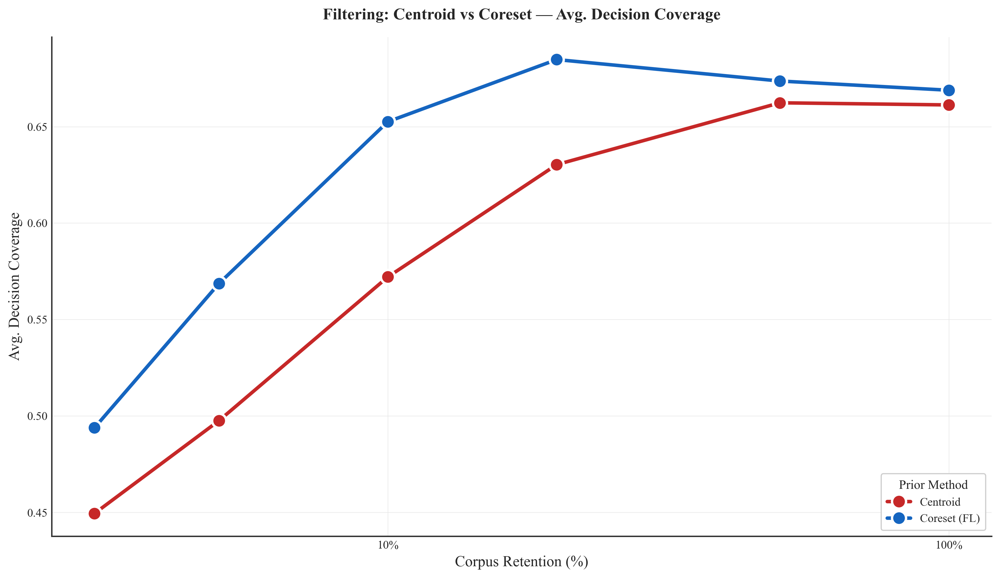

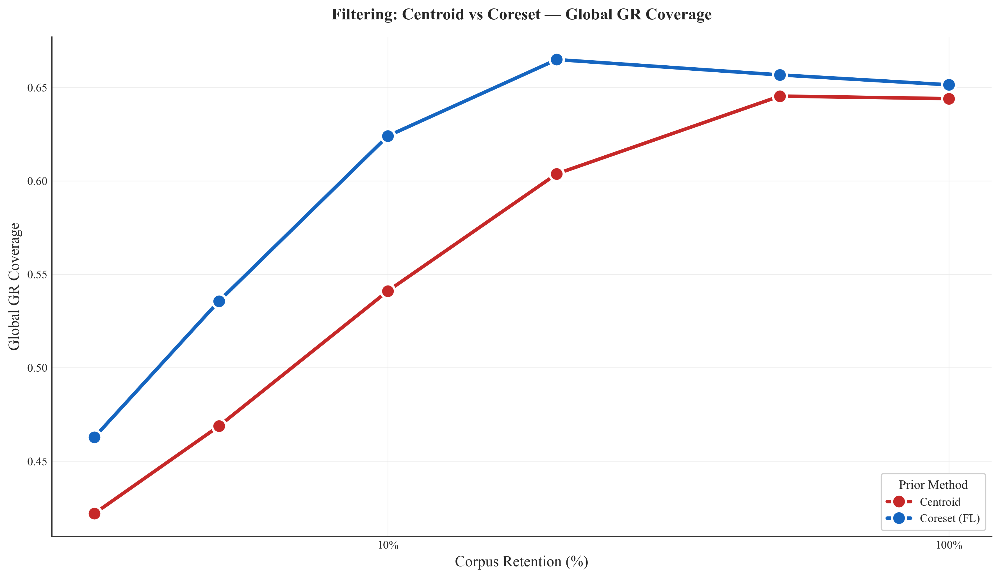

In [ ]:
# # ============================================================================
# # PLOT F2: Centroid vs Coreset filtering — coverage vs retention
# # Averaged across all models
# # ============================================================================
# def plot_filter_centroid_vs_coreset(df_agg, metric, metric_label, figsize=(12, 7)):
#     """Coverage vs retention %, comparing prior methods."""
#     grouped = df_agg.groupby(['prior_method', 'retain_pct'])[metric].mean().reset_index()
    
#     fig, ax = plt.subplots(figsize=figsize)
    
#     for prior in ['kmeans', 'coreset']:
#         pdata = grouped[grouped['prior_method'] == prior].sort_values('retain_pct')
#         color = PRIOR_COLORS.get('centroid' if prior == 'kmeans' else prior)
#         label = PRIOR_NAMES.get('centroid' if prior == 'kmeans' else prior, prior)
#         ax.plot(pdata['retain_pct'] * 100, pdata[metric], '-o',
#                 label=label, color=color, linewidth=3, markersize=12,
#                 markeredgecolor='white', markeredgewidth=2)
    
#     ax.set_xlabel('Corpus Retention (%)', fontweight='medium')
#     ax.set_ylabel(metric_label, fontweight='medium')
#     ax.set_title(f'Filtering: Centroid vs Coreset — {metric_label}', pad=15)
#     ax.legend(title='Prior Method', loc='lower right', framealpha=0.95)
#     ax.set_xticks([3, 5, 10, 20, 50, 100])
#     ax.set_xscale('log')
#     ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    
#     plt.tight_layout()
#     return fig, ax

# fig, ax = plot_filter_centroid_vs_coreset(df_filter_agg, 'avg_dec_coverage', 'Avg. Decision Coverage')
# plt.savefig(FIGURES_DIR / 'filter_centroid_vs_coreset_dec_coverage.pdf')
# plt.show()

# fig, ax = plot_filter_centroid_vs_coreset(df_filter_agg, 'gr_coverage', 'Global GR Coverage')
# plt.savefig(FIGURES_DIR / 'filter_centroid_vs_coreset_gr_coverage.pdf')
# plt.show()

In [33]:
# # ============================================================================
# # PLOT F4: Coverage Heatmap — Model × Retention %
# # ============================================================================
# def plot_filter_heatmap(df_agg, metric, metric_label, prior_method=None, figsize=(12, 6)):
#     """Heatmap: models (rows) vs retention % (columns)."""
#     data = df_agg if prior_method is None else df_agg[df_agg['prior_method'] == prior_method]
    
#     pivot = data.pivot_table(
#         index='model_short',
#         columns='retain_pct',
#         values=metric,
#         aggfunc='mean',
#     )
#     # Sort rows by 100% coverage descending
#     pivot = pivot.loc[pivot[1.0].sort_values(ascending=False).index]
#     # Rename columns to display %
#     pivot.columns = [f'{int(c*100)}%' for c in pivot.columns]
    
#     fig, ax = plt.subplots(figsize=figsize)
#     sns.heatmap(pivot, annot=True, fmt='.3f', cmap='RdYlGn', ax=ax,
#                 cbar_kws={'label': metric_label},
#                 annot_kws={'size': 10, 'weight': 'medium'}, linewidths=0.5, linecolor='white')
    
#     title = f'{metric_label} by Model & Retention %'
#     if prior_method:
#         title += f' — {PRIOR_NAMES.get("centroid" if prior_method == "kmeans" else prior_method, prior_method)}'
#     ax.set_title(title, pad=15, fontweight='bold')
#     ax.set_xlabel('Corpus Retention (%)', fontweight='medium')
#     ax.set_ylabel('Embedding Model', fontweight='medium')
    
#     plt.tight_layout()
#     return fig, ax

# # Heatmaps for both metrics, both priors
# for prior in ['kmeans', 'coreset']:
#     prior_label = 'centroid' if prior == 'kmeans' else prior
#     fig, ax = plot_filter_heatmap(df_filter_agg, 'avg_dec_coverage', 'Avg. Decision Coverage', prior_method=prior)
#     plt.savefig(FIGURES_DIR / f'filter_heatmap_dec_coverage_{prior_label}.pdf')
#     plt.show()

#     fig, ax = plot_filter_heatmap(df_filter_agg, 'gr_coverage', 'Global GR Coverage', prior_method=prior)
#     plt.savefig(FIGURES_DIR / f'filter_heatmap_gr_coverage_{prior_label}.pdf')
#     plt.show()

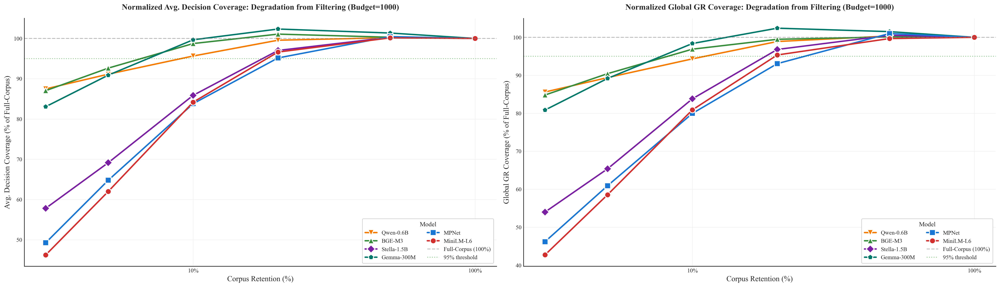

In [34]:
# ============================================================================
# PLOT F5: Normalized Coverage (% of full-corpus) — shows degradation relative to full corpus
# ============================================================================
def plot_filter_normalized_coverage(df_agg, metric, metric_label, ax=None):
    """Line plot: coverage normalized to oracle (100%) baseline, per model."""
    grouped = df_agg.groupby(['model_short', 'retain_pct'])[metric].mean().reset_index()
    
    if ax is None:
        _, ax = plt.subplots(figsize=(12, 7))
    
    oracle_perf = grouped[grouped['retain_pct'] == 1.0].set_index('model_short')[metric]
    
    for model in oracle_perf.sort_values(ascending=False).index:
        mdata = grouped[grouped['model_short'] == model].sort_values('retain_pct').copy()
        oracle_val = oracle_perf[model]
        mdata['normalized'] = mdata[metric] / oracle_val * 100
        
        color = MODEL_COLORS.get(model, '#333333')
        marker = MODEL_MARKERS.get(model, 'o')
        ax.plot(mdata['retain_pct'] * 100, mdata['normalized'], '-',
                marker=marker, label=model, color=color,
                linewidth=2.5, markersize=10, markeredgecolor='white', markeredgewidth=1.5)
    
    ax.axhline(y=100, color='gray', linestyle='--', alpha=0.5, linewidth=1.5, label='Full-Corpus (100%)')
    ax.axhline(y=95, color='green', linestyle=':', alpha=0.4, linewidth=1.5, label='95% threshold')
    
    ax.set_xlabel('Corpus Retention (%)', fontweight='medium')
    ax.set_ylabel(f'{metric_label} (% of Full-Corpus)', fontweight='medium')
    ax.set_title(f'Normalized {metric_label}: Degradation from Filtering (Budget=1000)', pad=15)
    ax.legend(title='Model', loc='lower right', ncol=2, framealpha=0.95)
    ax.set_xticks([3, 5, 10, 20, 50, 100])
    ax.set_xscale('log')
    ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}%'))
    ax.set_ylim(None, 105)
    
    return ax

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 7))
plot_filter_normalized_coverage(df_filter_agg, 'avg_dec_coverage', 'Avg. Decision Coverage', ax=ax1)
plot_filter_normalized_coverage(df_filter_agg, 'gr_coverage', 'Global GR Coverage', ax=ax2)
plt.tight_layout()
plt.savefig(FIGURES_DIR / 'filter_normalized_combined.pdf')
plt.show()


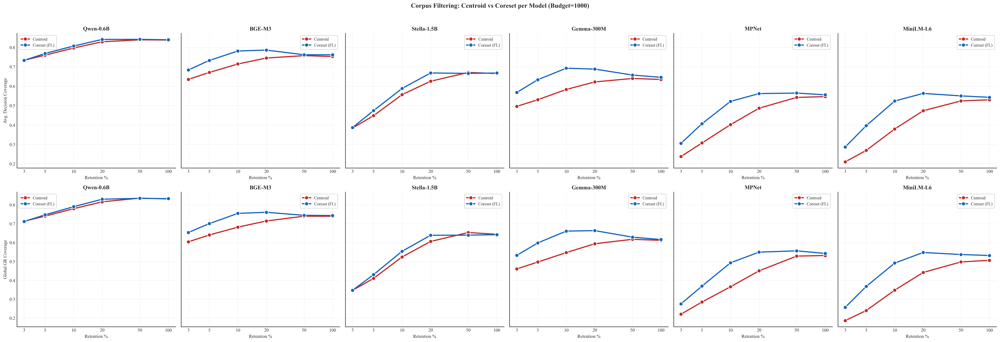

In [ ]:
# # ============================================================================
# # PLOT F6: Per-model faceted — Centroid vs Coreset filtering curves
# # Both metrics side by side: 2 rows (metrics) x 6 cols (models)
# # ============================================================================
# def plot_filter_faceted_prior_row(df_agg, metric, metric_label, axes_row, models):
#     """Plot one row of subplots for a single metric across all models."""
#     for idx, model in enumerate(models):
#         ax = axes_row[idx]
#         mdata = df_agg[df_agg['model_short'] == model]
        
#         for prior in ['kmeans', 'coreset']:
#             pdata = mdata[mdata['prior_method'] == prior].sort_values('retain_pct')
#             color = PRIOR_COLORS.get('centroid' if prior == 'kmeans' else prior)
#             label = PRIOR_NAMES.get('centroid' if prior == 'kmeans' else prior, prior)
#             ax.plot(pdata['retain_pct'] * 100, pdata[metric], '-o',
#                     label=label, color=color, linewidth=2.5, markersize=8,
#                     markeredgecolor='white', markeredgewidth=1.2)
        
#         ax.set_title(model, fontweight='bold', fontsize=12)
#         ax.set_xscale('log')
#         ax.set_xticks([3, 5, 10, 20, 50, 100])
#         ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}'))
#         ax.set_xlabel('Retention %', fontsize=10)
#         if idx == 0:
#             ax.set_ylabel(metric_label, fontsize=10)
#         ax.legend(fontsize=9, framealpha=0.9)

# # Get model order from first metric
# models = df_filter_agg.groupby('model_short').apply(
#     lambda g: g[g['retain_pct'] == 1.0]['avg_dec_coverage'].mean()
# ).sort_values(ascending=False).index.tolist()

# ncols = len(models)
# fig, axes = plt.subplots(2, ncols, figsize=(ncols * 5, 10), sharey='row')

# plot_filter_faceted_prior_row(df_filter_agg, 'avg_dec_coverage', 'Avg. Decision Coverage', axes[0], models)
# plot_filter_faceted_prior_row(df_filter_agg, 'gr_coverage', 'Global GR Coverage', axes[1], models)

# fig.suptitle('Corpus Filtering: Centroid vs Coreset per Model (Budget=1000)',
#              fontsize=14, fontweight='bold', y=1.02)
# plt.tight_layout()
# plt.savefig(FIGURES_DIR / 'filter_faceted_combined.pdf', bbox_inches='tight')
# plt.show()


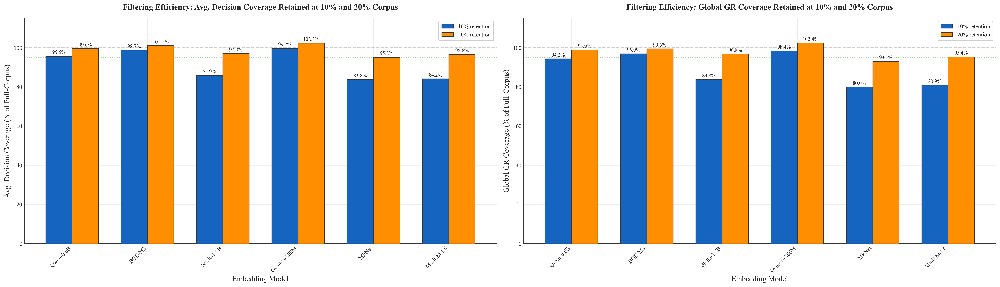

In [36]:
# ============================================================================
# PLOT F7: Coverage Retention Efficiency — bar chart at key thresholds
# Shows what % of full-corpus coverage is retained at 10% and 20% corpus retention
# ============================================================================
def plot_filter_efficiency_bars(df_agg, metric, metric_label, ax=None, retention_levels=[0.10, 0.20]):
    """Grouped bar: normalized coverage at key retention levels, per model."""
    # Compute oracle baseline
    oracle = df_agg[df_agg['retain_pct'] == 1.0].groupby('model_short')[metric].mean()
    
    if ax is None:
        _, ax = plt.subplots(figsize=(14, 7))
    
    model_order = oracle.sort_values(ascending=False).index.tolist()
    x = np.arange(len(model_order))
    width = 0.35
    
    bar_colors = ['#1565C0', '#FF8F00']
    
    for i, ret in enumerate(retention_levels):
        filtered = df_agg[df_agg['retain_pct'] == ret].groupby('model_short')[metric].mean()
        normalized = (filtered / oracle * 100).reindex(model_order)
        
        offset = (i - len(retention_levels)/2 + 0.5) * width
        bars = ax.bar(x + offset, normalized.values, width,
                      label=f'{int(ret*100)}% retention',
                      color=bar_colors[i], edgecolor='#333333', linewidth=0.8, zorder=3)
        
        for bar, val in zip(bars, normalized.values):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                    f'{val:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='medium')
    
    ax.axhline(y=100, color='gray', linestyle='--', alpha=0.4, linewidth=1.5)
    ax.axhline(y=95, color='green', linestyle=':', alpha=0.4, linewidth=1.5)
    
    ax.set_xlabel('Embedding Model', fontweight='medium')
    ax.set_ylabel(f'{metric_label} (% of Full-Corpus)', fontweight='medium')
    ax.set_title(f'Filtering Efficiency: {metric_label} Retained at 10% and 20% Corpus', pad=15)
    ax.set_xticks(x)
    ax.set_xticklabels(model_order, rotation=45, ha='right', fontweight='medium')
    ax.legend(framealpha=0.95)
    ax.set_ylim(0, 115)
    
    return ax

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 7))
plot_filter_efficiency_bars(df_filter_agg, 'avg_dec_coverage', 'Avg. Decision Coverage', ax=ax1)
plot_filter_efficiency_bars(df_filter_agg, 'gr_coverage', 'Global GR Coverage', ax=ax2)
plt.tight_layout()
plt.savefig(FIGURES_DIR / 'filter_efficiency_combined.pdf')
plt.show()


In [37]:
# ============================================================================
# SUMMARY TABLE: Filter experiment results
# ============================================================================
print("=" * 90)
print("FILTER EXPERIMENT SUMMARY TABLE")
print("=" * 90)

# Grand average across all models and both prior methods
grand_avg = df_filter_agg.groupby('retain_pct').agg(
    avg_dec_coverage=('avg_dec_coverage', 'mean'),
    gr_coverage=('gr_coverage', 'mean'),
    oracle_retention=('oracle_retention', 'mean'),
    num_units=('num_units', 'mean'),
).sort_values('retain_pct', ascending=False)

# Normalize to oracle
oracle_dec = grand_avg.loc[1.0, 'avg_dec_coverage']
oracle_gr = grand_avg.loc[1.0, 'gr_coverage']
grand_avg['dec_pct_of_oracle'] = grand_avg['avg_dec_coverage'] / oracle_dec * 100
grand_avg['gr_pct_of_oracle'] = grand_avg['gr_coverage'] / oracle_gr * 100
grand_avg.index = [f'{int(x*100)}%' for x in grand_avg.index]

print("\nGrand Average (all models, both prior methods):\n")
print(grand_avg[['num_units', 'avg_dec_coverage', 'dec_pct_of_oracle',
                  'gr_coverage', 'gr_pct_of_oracle', 'oracle_retention']].to_string(
    float_format=lambda x: f'{x:.4f}'))

# Per-model summary at 10% retention
print("\n" + "=" * 90)
print("PER-MODEL SUMMARY AT 10% RETENTION")
print("=" * 90)
at_10 = df_filter_agg[df_filter_agg['retain_pct'] == 0.10].groupby('model_short').agg(
    avg_dec_coverage=('avg_dec_coverage', 'mean'),
    gr_coverage=('gr_coverage', 'mean'),
    oracle_retention=('oracle_retention', 'mean'),
).sort_values('avg_dec_coverage', ascending=False)

oracle_by_model = df_filter_agg[df_filter_agg['retain_pct'] == 1.0].groupby('model_short')['avg_dec_coverage'].mean()
at_10['dec_pct_of_oracle'] = at_10['avg_dec_coverage'] / oracle_by_model * 100

print(at_10.to_string(float_format=lambda x: f'{x:.4f}'))

# Best prior method for filtering
print("\n" + "=" * 90)
print("CENTROID vs CORESET FOR FILTERING")
print("=" * 90)
prior_filter = df_filter_agg[df_filter_agg['retain_pct'] < 1.0].groupby('prior_method').agg(
    avg_dec_coverage=('avg_dec_coverage', 'mean'),
    gr_coverage=('gr_coverage', 'mean'),
    oracle_retention=('oracle_retention', 'mean'),
)
print(prior_filter.to_string(float_format=lambda x: f'{x:.4f}'))

print("\n" + "=" * 90)
print("FILTER EXPERIMENT ANALYSIS COMPLETE")
print("=" * 90)

FILTER EXPERIMENT SUMMARY TABLE

Grand Average (all models, both prior methods):

      num_units  avg_dec_coverage  dec_pct_of_oracle  gr_coverage  gr_pct_of_oracle  oracle_retention
100%   180.0739            0.6651           100.0000       0.6477          100.0000            1.0000
50%     89.7885            0.6680           100.4414       0.6510          100.5133            0.7540
20%     35.6407            0.6575            98.8684       0.6343           97.9353            0.4898
10%     17.5873            0.6123            92.0689       0.5825           89.9386            0.3450
5%       8.5102            0.5331            80.1600       0.5022           77.5347            0.2552
3%       4.8758            0.4717            70.9215       0.4424           68.3051            0.2174

PER-MODEL SUMMARY AT 10% RETENTION
             avg_dec_coverage  gr_coverage  oracle_retention  dec_pct_of_oracle
model_short                                                                    
Qwen-0.6